In [1]:
from typing import Dict, Iterable, Optional

import numpy as np
import torch
from torch.distributions import Normal, Poisson
from torch.distributions import kl_divergence as kld
from torch import tensor
import scanpy as sc
import anndata
import pandas as pd
import tools
import logging
import mira
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## regulatory potential (MIRA)

In [2]:
atac_model = mira.topics.AccessibilityTopicModel(counts_layer='counts',
                                                 dataset_loader_workers = 3)

rna_model = mira.topics.ExpressionTopicModel(
    endogenous_key='endog',
    exogenous_key='endog',
    counts_layer='counts',
    seed = 0,
    hidden=64, # to make the tutorial faster. In practice, use the default of 128!
)               

In [2]:
rna_data = anndata.read_h5ad("./data/datasets/NEAT_Seq/outputs/rna_interim_30LF_v1.h5ad")
atac_data =  anndata.read_h5ad("./data/datasets/NEAT_Seq/outputs/atac_interim_1.h5ad")

In [4]:
atac_data

AnnData object with n_obs × n_vars = 3370 × 78203
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell_id', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'ReadsInPeaks', 'FRIP', 'cell_id2', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_ChromVar', 'nFeature_ChromVar', 'RNA_snn_res.0.6', 'seurat_clusters', 'nCount_ADT', 'nFeature_ADT', 'S.Score', 'G2M.Score', 'Phase', 'FOXP3-norm', 'Helios-norm', 'Tbet-norm', 'GATA3-norm', 'RORgT-norm', 'batch_id', 'modality', 'new_clusters'
    var: 'gene_ids', 'feature_types', 'n_cells', 'modality', 'chr', 'start', 'end'

In [ ]:
# ## If there are pretrained models, load them

# rna_model = mira.topics.ExpressionTopicModel.load('MIRA/rna_topic_model.pth')
# atac_model = mira.topics.AccessibilityTopicModel.load('MIRA/atac_topic_model.pth')

## Train MIRA model

### RNA model

INFO:mira.adata_interface.topic_model:Predicting expression from genes from col: endog
INFO:mira.adata_interface.topic_model:Using highly-variable genes from col: endog
Learning rate range test: 100%|██████████| 310/310 [00:10<00:00, 28.80it/s]
INFO:mira.topic_model.base:Set learning rates to: (0.0010591984426266802, 0.2734492095568281)
INFO:mira.topic_model.base:Set learning rates to: (0.010049395021924293, 0.12916826046811425)


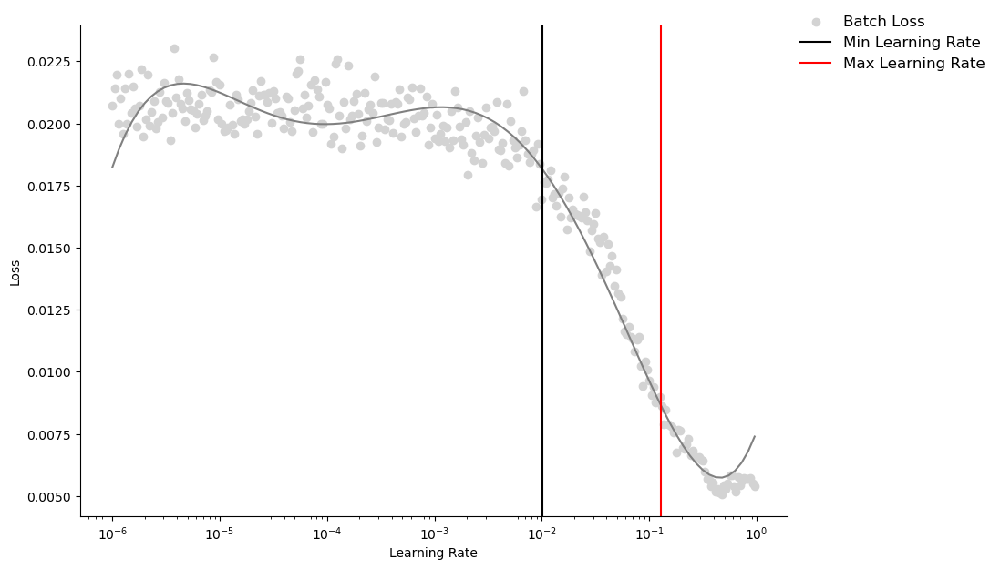

In [6]:
## Set up Rtuner
rna_model.get_learning_rate_bounds(rna_data, eval_every=1, upper_bound_lr=1)
rna_model.trim_learning_rate_bounds(2.25, 1.25)
_ = rna_model.plot_learning_rate_bounds()

In [7]:
Rtuner = mira.topics.TopicModelTuner(
    rna_model,
    save_name = 'tuning-tutorial',
    seed = 0,
    iters=64, # Recommend 30-64 iterations of tuning.
    max_topics = 55, # to speed up convergence! Leave at default of 55 when working with new data.
)
Rtuner.train_test_split(rna_data)

INFO:mira.adata_interface.topic_model:Added col: test_set
INFO:mira.adata_interface.core:Added cols to obs: test_set


In [8]:
Rtuner.tune(rna_data, n_workers=5)

Trials finished: 64 | Best trial: 37 | Best score: 2.9213e-01
Press ctrl+C,ctrl+C or esc,I+I,I+I in Jupyter notebook to stop early.

#Topics | Trials (number is #folds tested)
      5 | 1 
      6 | 5 1 
      7 | 2 1 1 
      8 | 5 5 
      9 | 5 5 5 5 
     10 | 5 5 
     11 | 5 5 5 
     12 | 5 1 
     13 | 5 5 5 1 2 
     14 | 5 5 5 5 
     15 | 5 5 5 1 
     16 | 5 
     17 | 5 3 5 3 3 
     18 | 2 
     19 | 5 5 5 2 1 
     20 | 4 5 
     21 | 5 5 2 
     22 | 2 
     23 | 5 5 
     24 | 1 
     25 | 1 
     26 | 5 1 
     27 | 1 
     28 | 5 
     30 | 2 
     31 | 1 1 
     35 | 2 
     41 | 5 
     45 | 1 

Trial Information:
Trial #0   | completed, score: 6.1630e-01 | params: {'batch_size': 32, 'beta': 0.9161, 'encoder_dropout': 0.0305, 'kl_strategy': 'cyclic', 'num_epochs': 21, 'num_layers': 2, 'num_topics': 8}
Trial #1   | completed, score: 6.1427e-01 | params: {'batch_size': 32, 'beta': 0.9383, 'encoder_dropout': 0.0693, 'kl_strategy': 'cyclic', 'num_epochs': 31, 'num_laye

In [9]:
Rtuner.select_best_model(rna_data, record_umaps=False)

INFO:mira.topic_model.trainer:Training model with parameters: {'batch_size': 32, 'beta': 0.9085, 'encoder_dropout': 0.1272, 'kl_strategy': 'monotonic', 'num_epochs': 29, 'num_layers': 2, 'num_topics': 19}
Epoch 30 done. Recent losses: 2.908e-01 --> 2.908e-01 --> 2.906e-01 --> 2.906e-01 --> 2.905e-01: 100%|██████████| 29/29 [00:51<00:00,  1.77s/it]
INFO:mira.topic_model.trainer:Score: 2.90693e-01
INFO:mira.topic_model.trainer:Training model with parameters: {'batch_size': 64, 'beta': 0.9347, 'encoder_dropout': 0.1418, 'kl_strategy': 'monotonic', 'num_epochs': 32, 'num_layers': 2, 'num_topics': 20}
Epoch 33 done. Recent losses: 2.903e-01 --> 2.901e-01 --> 2.902e-01 --> 2.901e-01 --> 2.902e-01: 100%|██████████| 32/32 [00:41<00:00,  1.31s/it]
INFO:mira.topic_model.trainer:Score: 2.90771e-01
INFO:mira.topic_model.trainer:Training model with parameters: {'batch_size': 64, 'beta': 0.9073, 'encoder_dropout': 0.1416, 'kl_strategy': 'cyclic', 'num_epochs': 23, 'num_layers': 2, 'num_topics': 16}


ExpressionTopicModel(
  (decoder): Decoder(
    (beta): Linear(in_features=19, out_features=2364, bias=False)
    (bn): BatchNorm1d(2364, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (drop): Dropout(p=0.2, inplace=False)
  )
  (encoder): ExpressionEncoder(
    (fc_layers): Sequential(
      (0): Sequential(
        (0): Linear(in_features=2365, out_features=64, bias=True)
        (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Dropout(p=0.12721353722267706, inplace=False)
      )
      (1): Sequential(
        (0): Linear(in_features=64, out_features=40, bias=True)
        (1): BatchNorm1d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
  )
)

In [10]:
rna_model.save('MIRA/NEATseq_rna_topic_model.pth')


Predicting latent vars: 100%|██████████| 7/7 [00:00<00:00,  7.79it/s]
INFO:mira.adata_interface.core:Added key to obsm: X_topic_compositions
INFO:mira.adata_interface.topic_model:Added cols: topic_0, topic_1, topic_2, topic_3, topic_4, topic_5, topic_6, topic_7, topic_8, topic_9, topic_10, topic_11, topic_12, topic_13, topic_14, topic_15, topic_16, topic_17, topic_18
INFO:mira.adata_interface.core:Added key to varm: topic_feature_compositions
INFO:mira.adata_interface.core:Added key to varm: topic_feature_activations
INFO:mira.adata_interface.topic_model:Added key to uns: topic_dendogram
INFO:mira.adata_interface.topic_model:Fetching key X_topic_compositions from obsm
INFO:mira.adata_interface.core:Added key to obsm: X_umap_features


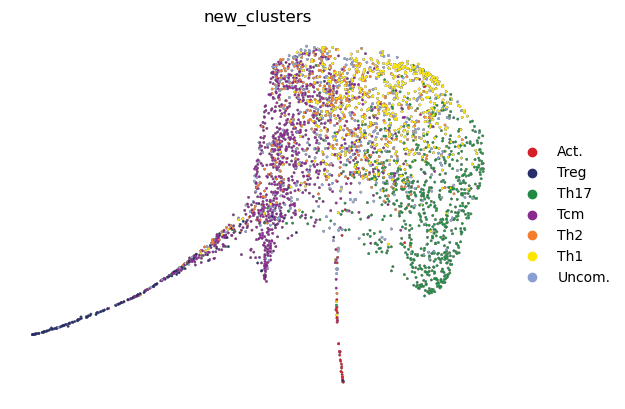

In [14]:
rna_model.predict(rna_data)
rna_model.get_umap_features(rna_data, box_cox=0.5)
sc.pp.neighbors(rna_data, use_rep = 'X_umap_features', metric = 'manhattan')
sc.tl.umap(rna_data, min_dist=0.3, negative_sample_rate=0.05)

Cluster_color = {
                "Act.": "#D51F26",
                "Treg": "#272E6A",
                "Th17": "#208A42",
                "Tcm": "#89288F",
                "Th2": "#F47D2B",
                "Th1": "#FEE500",
                "Uncom.": "#8A9FD1"    
                }

sc.pl.umap(rna_data, frameon=False, size = 10, alpha = 1, add_outline=True,
          outline_width=(0.1,0), color='new_clusters',palette=Cluster_color)

### Train ATAC model

In [15]:
atac_data.raw = atac_data
atac_data.layers['counts'] = atac_data.raw.to_adata().X.copy()

Learning rate range test:  95%|█████████▍| 294/310 [00:07<00:00, 44.43it/s]ERROR:mira.topic_model.base:
Gradient overflow from too high learning rate, stopping test early.
INFO:mira.topic_model.base:Set learning rates to: (1.2799198196863761e-05, 0.2331631451089069)
INFO:mira.topic_model.base:Set learning rates to: (1.2799326189485687e-05, 0.31473732502737967)
Learning rate range test:  96%|█████████▌| 298/310 [00:07<00:00, 39.54it/s]


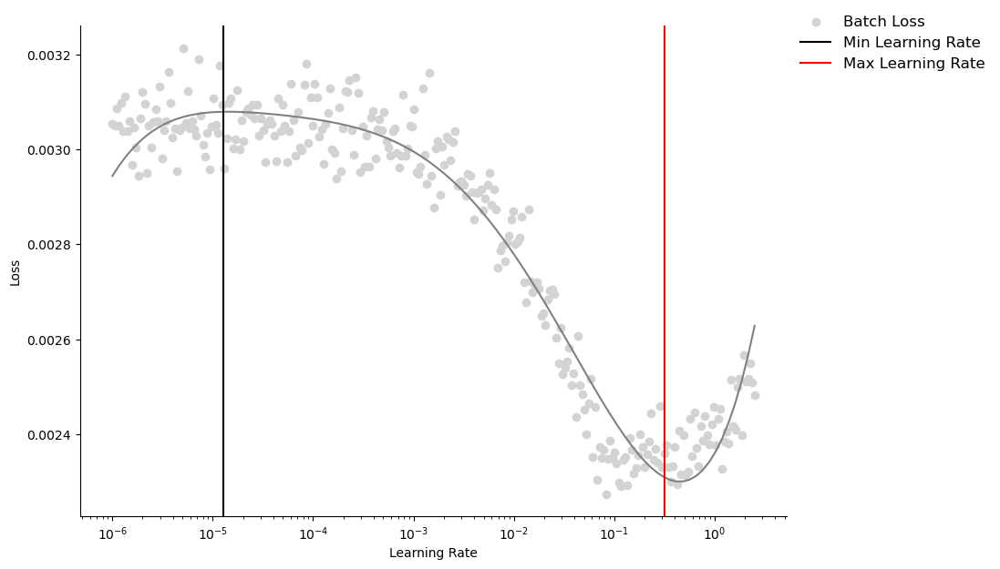

In [18]:
atac_model.get_learning_rate_bounds(atac_data, eval_every=1, upper_bound_lr=5)
atac_model.trim_learning_rate_bounds(1e-5, 0.2)
_ = atac_model.plot_learning_rate_bounds()

In [23]:
Atuner = mira.topics.TopicModelTuner(
    atac_model,
    save_name = 'ATAC',
    seed = 0,
    iters=30, # Recommend 30-64 iterations of tuning.
    max_topics = 55 # to speed up convergence! Leave at default of 55 when working with new data.
)
Atuner.train_test_split(atac_data, train_size=0.8)

INFO:mira.adata_interface.topic_model:Added col: test_set
INFO:mira.adata_interface.core:Added cols to obs: test_set


In [24]:
Atuner.tune(atac_data, n_workers=5)

In [25]:
Atuner.select_best_model(atac_data, record_umaps=False)

INFO:mira.topic_model.trainer:Training model with parameters: {'batch_size': 128, 'beta': 0.9319, 'encoder_dropout': 0.1345, 'kl_strategy': 'monotonic', 'num_epochs': 38, 'num_layers': 2, 'num_topics': 23}
Epoch 39 done. Recent losses: 1.448e-01 --> 1.447e-01 --> 1.448e-01 --> 1.449e-01 --> 1.448e-01: 100%|██████████| 38/38 [00:35<00:00,  1.08it/s]
INFO:mira.topic_model.trainer:Score: 1.46734e-01
INFO:mira.topic_model.trainer:Training model with parameters: {'batch_size': 128, 'beta': 0.9326, 'encoder_dropout': 0.1341, 'kl_strategy': 'monotonic', 'num_epochs': 40, 'num_layers': 2, 'num_topics': 23}
Epoch 41 done. Recent losses: 1.447e-01 --> 1.445e-01 --> 1.448e-01 --> 1.446e-01 --> 1.446e-01: 100%|██████████| 40/40 [00:36<00:00,  1.09it/s]
INFO:mira.topic_model.trainer:Score: 1.46763e-01
INFO:mira.topic_model.trainer:Training model with parameters: {'batch_size': 128, 'beta': 0.9177, 'encoder_dropout': 0.1473, 'kl_strategy': 'monotonic', 'num_epochs': 37, 'num_layers': 2, 'num_topics'

AccessibilityTopicModel(
  (decoder): Decoder(
    (beta): Linear(in_features=24, out_features=78203, bias=False)
    (bn): BatchNorm1d(78203, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (drop): Dropout(p=0.2, inplace=False)
  )
  (encoder): DANEncoder(
    (drop): Dropout(p=0.14459980017973162, inplace=False)
    (embedding): Embedding(78204, 128, padding_idx=0)
    (fc_layers): Sequential(
      (0): Sequential(
        (0): Linear(in_features=129, out_features=48, bias=True)
        (1): BatchNorm1d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
  )
)

In [27]:
atac_model.save('MIRA/NEATseq_atac_topic_model.pth')

Predicting latent vars: 100%|██████████| 7/7 [00:02<00:00,  2.55it/s]
INFO:mira.adata_interface.core:Added key to obsm: X_topic_compositions
INFO:mira.adata_interface.topic_model:Added cols: topic_0, topic_1, topic_2, topic_3, topic_4, topic_5, topic_6, topic_7, topic_8, topic_9, topic_10, topic_11, topic_12, topic_13, topic_14, topic_15, topic_16, topic_17, topic_18, topic_19, topic_20, topic_21, topic_22, topic_23
INFO:mira.adata_interface.core:Added key to varm: topic_feature_compositions
INFO:mira.adata_interface.core:Added key to varm: topic_feature_activations
INFO:mira.adata_interface.topic_model:Added key to uns: topic_dendogram
INFO:mira.adata_interface.topic_model:Fetching key X_topic_compositions from obsm
INFO:mira.adata_interface.core:Added key to obsm: X_umap_features
/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/umap/umap_.py:1356: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


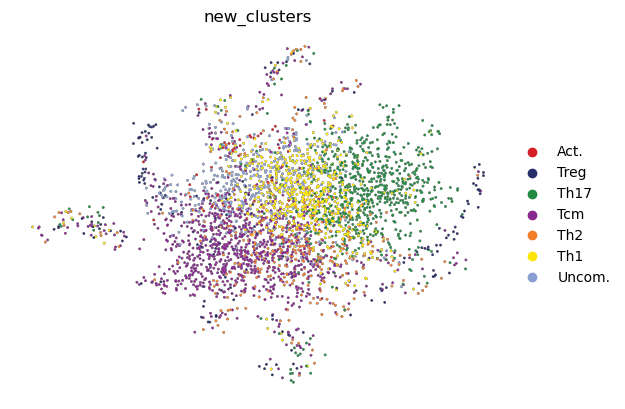

In [34]:
atac_model.predict(atac_data)
atac_model.get_umap_features(atac_data, box_cox=0.5)
sc.pp.neighbors(atac_data, use_rep = 'X_umap_features', metric = 'manhattan')
sc.tl.umap(atac_data, min_dist=2, negative_sample_rate=0.05)

sc.pl.umap(atac_data, frameon=False, size = 10, alpha = 1, add_outline=True,
          outline_width=(0.1,0), color='new_clusters',palette=Cluster_color)

In [35]:
atac_data.write_h5ad("./data/datasets/NEAT_Seq/outputs/atac_interim_mira.h5ad")
rna_data.write_h5ad("./data/datasets/NEAT_Seq/outputs/rna_interim_30LF_mira.h5ad")

In [6]:
## MIRA neat-seq benchmark
rna_data = anndata.read_h5ad("./data/datasets/NEAT_Seq/outputs/rna_interim_30LF_mira.h5ad")
atac_data =  anndata.read_h5ad("./data/datasets/NEAT_Seq/outputs/atac_interim_mira.h5ad")


In [8]:
atac_data

AnnData object with n_obs × n_vars = 3370 × 78203
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell_id', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'ReadsInPeaks', 'FRIP', 'cell_id2', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_ChromVar', 'nFeature_ChromVar', 'RNA_snn_res.0.6', 'seurat_clusters', 'nCount_ADT', 'nFeature_ADT', 'S.Score', 'G2M.Score', 'Phase', 'FOXP3-norm', 'Helios-norm', 'Tbet-norm', 'GATA3-norm', 'RORgT-norm', 'batch_id', 'modality', 'new_clusters', 'test_set', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 'topic_7', 'topic_8', 'topic_9', 'topic_10', 'topic_11', 'topic_12', 'topic_13', 'topic_14', 'topic_15', 'topic_16', 'topic_17', 'topic_18', 'topic_19', 'topic_20', 'topic_21', 'topic_22', 'topic_23'
    var: 'gene_ids', 'feature_types', 'n_cells', 'modality', 'chr', 'st

In [9]:
latent_rna = rna_data.obs[[ 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 
'topic_7', 'topic_8', 'topic_9', 'topic_10', 'topic_11', 'topic_12', 'topic_13', 'topic_14', 'topic_15', 'topic_16', 'topic_17', 'topic_18']]

latent_atac = atac_data.obs[[ 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 
'topic_7', 'topic_8', 'topic_9', 'topic_10', 'topic_11', 'topic_12', 
'topic_13', 'topic_14', 'topic_15', 'topic_16', 'topic_17', 'topic_18', 
'topic_19', 'topic_20', 'topic_21', 'topic_22', 'topic_23']]

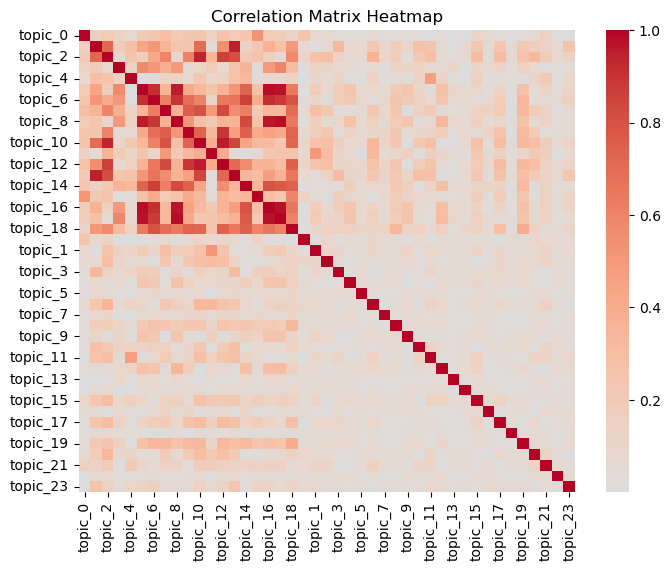

In [10]:
df_combined = pd.concat([latent_rna,latent_atac], axis=1)
correlation_matrix = df_combined.corr()
correlation_matrix = np.abs(correlation_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", center=0.0)
plt.title('Correlation Matrix Heatmap')
plt.show()


(array([0]), [Text(0, 0, 'mira')])

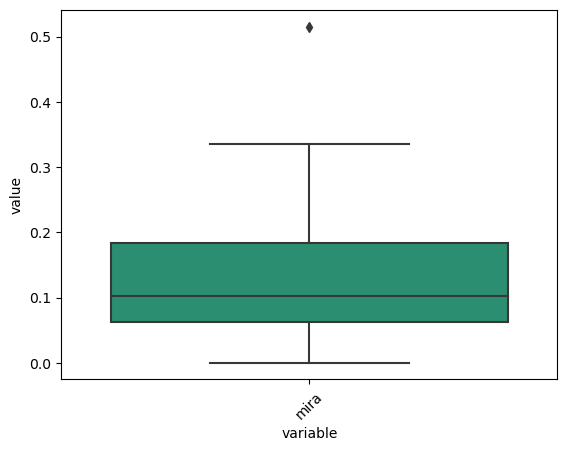

In [12]:
# lower_triangular_matrix = np.tril(correlation_matrix, k=-1)
# lower_diagonal_values = lower_triangular_matrix[lower_triangular_matrix != 0]
sub_corr = correlation_matrix.iloc[np.arange(0,19), np.arange(19, 24)]
df = pd.DataFrame({"variable": "mira", "value": sub_corr.to_numpy().flatten()})
ax = sns.boxplot(x='variable', y='value', data=df, palette="Dark2")
plt.xticks(rotation=45)

In [13]:
df.to_csv("figs/correlation_benchmark/NEATseq_corr_mira.csv")

### get TSS annotation

In [49]:
# mira.datasets.hg38_chrom_sizes()
# mira.datasets.hg38_tss_data()

INFO:mira.datasets.datasets:Dataset contents:
	* mira-datasets/hg38.chrom.sizes
INFO:mira.datasets.datasets:Dataset contents:
	* mira-datasets/hg38_tss_data.bed12


In [50]:
!head -n3 mira-datasets/hg38.chrom.sizes


chr1	248956422
chr2	242193529
chr3	198295559


In [117]:
atac_data

AnnData object with n_obs × n_vars = 3370 × 78203
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell_id', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'ReadsInPeaks', 'FRIP', 'cell_id2', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_ChromVar', 'nFeature_ChromVar', 'RNA_snn_res.0.6', 'seurat_clusters', 'nCount_ADT', 'nFeature_ADT', 'S.Score', 'G2M.Score', 'Phase', 'FOXP3-norm', 'Helios-norm', 'Tbet-norm', 'GATA3-norm', 'RORgT-norm', 'batch_id', 'modality', 'new_clusters', 'test_set', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 'topic_7', 'topic_8', 'topic_9', 'topic_10', 'topic_11', 'topic_12', 'topic_13', 'topic_14', 'topic_15', 'topic_16', 'topic_17', 'topic_18', 'topic_19', 'topic_20', 'topic_21', 'topic_22', 'topic_23', 'softmax_denom'
    var: 'peak', 'feature_types', 'n_cells', 'modality

In [54]:
## ATAC data get TSS annotation

mira.tl.get_distance_to_TSS(atac_data,
tss_data='mira-datasets/hg38_tss_data.bed12',
genome_file='mira-datasets/hg38.chrom.sizes')

INFO:mira.tools.connect_genes_peaks:Finding peak intersections with promoters ...
INFO:mira.tools.connect_genes_peaks:Calculating distances between peaks and TSS ...
INFO:mira.tools.connect_genes_peaks:Masking other genes' promoters ...
INFO:mira.adata_interface.rp_model:Added key to var: distance_to_TSS
INFO:mira.adata_interface.rp_model:Added key to uns: distance_to_TSS_genes


In [55]:
atac_data.write_h5ad("./data/datasets/NEAT_Seq/outputs/atac_interim_mira.h5ad")

### change peak information

In [8]:
atac_data.var = atac_data.var.rename(columns={'gene_ids':'peak'})

In [9]:
atac_data.var['peak_id'] = range(1,len(atac_data.var)+1)
atac_data.var = atac_data.var.set_index('peak_id')


/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [1, 2, 3, 4, 5]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


In [10]:
atac_data.var.head()

,peak,feature_types,n_cells,modality,chr,start,end
peak_id,,,,,,,
1,chr1-817095-817595,Peaks,45,Peaks,chr1,817095,817595
2,chr1-827298-827798,Peaks,153,Peaks,chr1,827298,827798
3,chr1-844407-844907,Peaks,45,Peaks,chr1,844407,844907
4,chr1-857908-858408,Peaks,16,Peaks,chr1,857908,858408
5,chr1-869618-870118,Peaks,133,Peaks,chr1,869618,870118


## Run RP

In [4]:
from typing import Dict, Iterable, Optional

import numpy as np
import torch
from torch.distributions import Normal, Poisson
from torch.distributions import kl_divergence as kld
from torch import tensor
import scanpy as sc
import anndata
import pandas as pd
import tools
import logging
import mira
from causal_utils import infer_nonsta_dir

In [5]:
## model setup
atac_model = mira.topics.AccessibilityTopicModel(counts_layer='counts',
                                                 dataset_loader_workers = 3)

rna_model = mira.topics.ExpressionTopicModel(
    endogenous_key='endog',
    exogenous_key='endog',
    counts_layer='counts',
    seed = 0,
    hidden=64, # to make the tutorial faster. In practice, use the default of 128!
)          


rna_model = mira.topics.ExpressionTopicModel.load('MIRA/NEATseq_rna_topic_model.pth')
atac_model = mira.topics.AccessibilityTopicModel.load('MIRA/NEATseq_atac_topic_model.pth')

/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/torch/cuda/__init__.py:88: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:109.)
  return torch._C._cuda_getDeviceCount() > 0
INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu
INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu


In [6]:
## loading the data
rna_data = anndata.read_h5ad("./data/datasets/NEAT_Seq/outputs/rna_interim_30LF_mira.h5ad")
atac_data =  anndata.read_h5ad("./data/datasets/NEAT_Seq/outputs/atac_interim_mira.h5ad")

In [7]:
"TSEN54" in rna_data.var.index.tolist()

True

In [23]:
atac_data

AnnData object with n_obs × n_vars = 3370 × 78203
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell_id', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'ReadsInPeaks', 'FRIP', 'cell_id2', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_ChromVar', 'nFeature_ChromVar', 'RNA_snn_res.0.6', 'seurat_clusters', 'nCount_ADT', 'nFeature_ADT', 'S.Score', 'G2M.Score', 'Phase', 'FOXP3-norm', 'Helios-norm', 'Tbet-norm', 'GATA3-norm', 'RORgT-norm', 'batch_id', 'modality', 'new_clusters', 'test_set', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 'topic_7', 'topic_8', 'topic_9', 'topic_10', 'topic_11', 'topic_12', 'topic_13', 'topic_14', 'topic_15', 'topic_16', 'topic_17', 'topic_18', 'topic_19', 'topic_20', 'topic_21', 'topic_22', 'topic_23'
    var: 'gene_ids', 'feature_types', 'n_cells', 'modality', 'chr', 'st

In [8]:
rp_args = dict(expr_adata = rna_data, atac_adata= atac_data)
# rp_genes = list(rna_model.features[rna_model.highly_variable])
# rp_genes = [str(e).upper() for e in rp_genes] + ['B3GALT1',"CSMD1"]
# rp_genes = rp_genes[:3]
# for topic in range(rna_model.num_topics):
#     rp_genes.extend(rna_model.get_top_genes(topic, 200))
# rp_genes = list(set(rp_genes))
# rp_genes = [str(e).upper() for e in rp_genes] + ['TPM1', "GRIN2B", "VCAN", "NRP1", "ROBO1", "GM29260", "MCFD2", "SF3B3", "HMRHL", "ATXN1", "FABP7", "CELSR1", "CTCF"]
# rp_genes.remove("GM5089-1")
# rp_genes.remove("PAKAP-1")
rp_genes = ["TSEN54"]

In [6]:
rp_genes_updated = list(set(rp_genes) & set(atac_data.uns['TSS_metadata']['gene']) )

In [9]:
# ## add individual genes

# rp_genes_updated = rp_genes_updated + ["FOXP3","TBX21",'TCF7','LEF1','NFATC1','IKZF2','RORC']

# rp_genes_updated = list(set(rp_genes_updated))

rp_genes_updated = ["SOCS1", "SOCS3", "CCR4", "IL4R", "BCL6"]
rp_genes_updated = ["TSEN54"]

In [10]:
litemodel = mira.rp.LITE_Model(expr_model = rna_model,
                              accessibility_model=atac_model,
                              counts_layer='counts',
                              genes = rp_genes_updated)

In [11]:
## training the model
litemodel.fit(**rp_args, n_workers=4,
              callback = mira.rp.SaveCallback("rpmodels/NEAT_seq/"))

INFO:mira.adata_interface.core:Added cols to obs: model_read_scale
INFO:mira.adata_interface.topic_model:Fetching key X_topic_compositions from obsm
Calculating softmax summary data: 100%|██████████| 7/7 [00:00<00:00, 1086.25it/s]
INFO:mira.adata_interface.core:Added cols to obs: softmax_denom
INFO:mira.adata_interface.topic_model:Fetching key X_topic_compositions from obsm
Calculating softmax summary data: 100%|██████████| 7/7 [00:00<00:00, 16.42it/s]
INFO:mira.adata_interface.core:Added cols to obs: softmax_denom
Fitting models: 100%|██████████| 1/1 [00:00<00:00, 15.10it/s]


In [10]:
litemodel.load("rpmodels/NEAT_seq/")

In [11]:
table = litemodel["GATA3"].get_influential_local_peaks(atac_data, decay_periods = 5.)
table

/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:295: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['distance_to_TSS'] = np.abs(dist)
/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['is_upstream'] = dist <= 0


,gene_ids,feature_types,n_cells,modality,chr,start,end,distance_to_TSS,is_upstream
Id,,,,,,,,,
chr10-8026583-8027083,chr10-8026583-8027083,Peaks,20,Peaks,chr10,8026583,8027083,27976.0,True
chr10-8035320-8035820,chr10-8035320-8035820,Peaks,22,Peaks,chr10,8035320,8035820,19239.0,True
chr10-8042253-8042753,chr10-8042253-8042753,Peaks,24,Peaks,chr10,8042253,8042753,12306.0,True
chr10-8043452-8043952,chr10-8043452-8043952,Peaks,31,Peaks,chr10,8043452,8043952,11107.0,True
chr10-8044828-8045328,chr10-8044828-8045328,Peaks,30,Peaks,chr10,8044828,8045328,9731.0,True
chr10-8045463-8045963,chr10-8045463-8045963,Peaks,26,Peaks,chr10,8045463,8045963,9096.0,True
chr10-8048604-8049104,chr10-8048604-8049104,Peaks,249,Peaks,chr10,8048604,8049104,5955.0,True
chr10-8049293-8049793,chr10-8049293-8049793,Peaks,21,Peaks,chr10,8049293,8049793,5266.0,True
chr10-8049900-8050400,chr10-8049900-8050400,Peaks,18,Peaks,chr10,8049900,8050400,4659.0,True


In [12]:
from scipy.sparse import csr_matrix
from scipy.sparse import diags

def tfidf_norm(adata_atac, scale_factor=1e4):
    """TF-IDF normalization.
    This function normalizes counts in an AnnData object with TF-IDF.
    Parameters
    ----------
    adata_atac: :class:`~anndata.AnnData`
        ATAC anndata object.
    scale_factor: `float` (default: 1e4)
        Value to be multiplied after normalization.
    copy: `bool` (default: `False`)
        Whether to return a copy or modify `.X` directly.
    Returns
    -------
    If `copy==True`, a new ATAC anndata object which stores normalized counts in `.X`.
    """
    npeaks = adata_atac.X.sum(1)
    npeaks_inv = csr_matrix(1.0/npeaks)
    tf = adata_atac.X.multiply(npeaks_inv)
    idf = diags(np.ravel(adata_atac.X.shape[0] / adata_atac.X.sum(0))).log1p()
    new_X = tf.dot(idf) * scale_factor
    return new_X


In [13]:
norm_X = tfidf_norm(atac_data)

In [14]:
def aggregate_local_atac(table, norm_X):
    indices = table.index.to_numpy().astype(np.int64)
    gene_peaks = norm_X[:, indices]
    gene_peaks = np.sum(gene_peaks, axis=1)
    
    return gene_peaks

def get_gene_local_atac(genename, litemodel, rna_data, atac_data, norm_X):
    table = litemodel[genename].get_influential_local_peaks(atac_data, decay_periods = 5.)
    peaks = aggregate_local_atac(table, norm_X)
    rna_data.obs["local_peaks"] = peaks

def get_gene_local_atac_mtx(genenames, litemodel, rna_data, atac_data, norm_X):
    for genename in genenames:
        table = litemodel[genename].get_influential_local_peaks(atac_data, decay_periods = 5.)
        peaks = aggregate_local_atac(table, norm_X)
        name = genename+"local_peaks"
        rna_data.obs[name] = peaks



In [15]:
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline

def get_norm_gene_local(genename,time):
    peak_mean = rna_data.obs.groupby(time)["local_peaks"].mean()
    rna_data.obs["temp_gene"] =   rna_data[:,[genename.capitalize()]].X.toarray()
    gene_mean = rna_data.obs.groupby(time)["temp_gene"].mean()
    timelist = rna_data.obs.time.unique().tolist()
    genesplie = make_interp_spline(np.array(timelist), gene_mean.value)

    df = pd.DataFrame([peak_mean, gene_mean, genesplie]).T
    df = df.reset_index()
    fig, ax = plt.subplots()
    df.plot(x=time, y = "local_peaks", ax=ax)
    df.plot(x=time, y = "temp_gene", ax=ax,secondary_y=True, color="r")



## Calculate the individual gene causal score
### The higher score and positive,  the more decoupled genes are
### The lower score and negative,  the lower genes are

In [16]:

def gene_level_casual(genename,time, litemodel,rna_data,atac_data, norm_X, width=0.1):
    get_gene_local_atac(genename, litemodel, rna_data, atac_data, norm_X)
    # peak_mean = rna_data.obs.groupby(time)["local_peaks"].mean().values
    rna_data.obs["temp_gene"] =   rna_data[:,[genename.upper()]].X.toarray()
    peaks = rna_data.obs["local_peaks"]
    genes = rna_data.obs["temp_gene"]
    times = rna_data.obs[time]
    print("peaks shap {}, genes {}, time {}".format(peaks.shape, genes.shape, times.shape))
    gene_mean = genes
    peak_mean = peaks
    timelist = times
    # gene_mean = rna_data.obs.groupby(time)["temp_gene"].mean().values
    gene_mean = np.expand_dims(gene_mean, axis=1)
    peak_mean = np.expand_dims(peak_mean, axis=1)
    # timelist = rna_data.obs[time].unique()
    timelist = timelist.astype(np.float64)
    timelist = sorted(timelist)
    timelist = np.expand_dims(timelist, axis=1)

    score_ar, _, _ = infer_nonsta_dir(peak_mean, gene_mean, timelist, width=0.1)
    score_ra, _, _ =infer_nonsta_dir(gene_mean, peak_mean, timelist, width=0.1)
    score_ar = np.log(score_ar)
    score_ra = np.log(score_ra)
    score = -(score_ar - score_ra)

    return score, score_ar, score_ra


### Plot the integrated gene curves

In [23]:

def smooth_gene_peaks_plot(genename,time, linewidth, points=1000, save=False, legend=True):
    peak_mean = rna_data.obs.groupby(time)["local_peaks"].mean()
    rna_data.obs["temp_gene"] =   rna_data[:,[genename.upper()]].X.toarray()
    gene_mean = rna_data.obs.groupby(time)["temp_gene"].mean()
    timelist = rna_data.obs[time].unique()
    timelist = timelist.astype(np.float64)
    timelist = sorted(timelist)
    genesplie = make_interp_spline(np.array(timelist), gene_mean.values)
    peaksplie = make_interp_spline(np.array(timelist), peak_mean.values)
    X_ = np.linspace(timelist[0], timelist[-1], points)
    smooth_gene = genesplie(X_)
    smooth_peaks = peaksplie(X_)
    df = pd.DataFrame(index=X_)
    df["smooth_gene"] = smooth_gene
    df["smooth_peaks"] = smooth_peaks
    df = df.reset_index() 
    fig, ax = plt.subplots()
    # ax.grid(True)
        
    df.plot(x="index", y = "smooth_peaks", ax=ax, linewidth=linewidth, legend=legend)
    df.plot(x="index", y = "smooth_gene", ax=ax,secondary_y=True, color="r", linewidth=linewidth, legend=legend)
    if save:
        fig.savefig(save)

In [26]:
atac_data.var['peak_id'] = range(1,len(atac_data.var)+1)
atac_data.var = atac_data.var.set_index('peak_id')
atac_data.var .head()

/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [1, 2, 3, 4, 5]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


,gene_ids,feature_types,n_cells,modality,chr,start,end
peak_id,,,,,,,
1,chr1-817095-817595,Peaks,45,Peaks,chr1,817095,817595
2,chr1-827298-827798,Peaks,153,Peaks,chr1,827298,827798
3,chr1-844407-844907,Peaks,45,Peaks,chr1,844407,844907
4,chr1-857908-858408,Peaks,16,Peaks,chr1,857908,858408
5,chr1-869618-870118,Peaks,133,Peaks,chr1,869618,870118


In [18]:
rna_data.obs["latent_time_cat"] = pd.cut(rna_data.obs['GATA3-norm'], 15, labels=[str(i) for i in range(15)])
rna_data.obs["latent_time_3"] = pd.cut(rna_data.obs['GATA3-norm'], 5, labels=[str(i) for i in range(5)])
rna_data.obs["latent_time_4"] = pd.cut(rna_data.obs['GATA3-norm'], 100, labels=[str(i) for i in range(100)])

In [19]:
rna_data.obs["latent_time_cat"]

lane1#AAACCAACATAGCGAG-1_paired    10
lane1#AAACCAACATTCAGCA-1_paired     8
lane1#AAACCGAAGGCTGTCA-1_paired     7
lane1#AAACCGGCAAGGGTTG-1_paired     8
lane1#AAACGGATCCTGTTCA-1_paired     6
                                   ..
lane2#TTTGTGAAGTTGGATC-1_paired     6
lane2#TTTGTGGCAATAACGA-1_paired     8
lane2#TTTGTGGCACCCTCAC-1_paired    11
lane2#TTTGTGTTCAGGTCCA-1_paired     7
lane2#TTTGTGTTCCTAAGAC-1_paired     7
Name: latent_time_cat, Length: 3370, dtype: category
Categories (15, object): ['0' < '1' < '2' < '3' ... '11' < '12' < '13' < '14']

In [43]:
# from causal_utils import infer_nonsta_dir

# genename = "B3GALT1"
# time = "latent_time_cat"
# get_gene_local_atac(genename, litemodel, rna_data, atac_data, norm_X)
genename = "RORC"
genename = genename.upper()
time = 'GATA3-norm'
gene_level_casual(genename,time, litemodel,rna_data,atac_data, norm_X,width=0.1)

IndexError: Model for gene RORC does not exist

In [28]:
rna_data.obs["latent_time_4"]

lane1#AAACCAACATAGCGAG-1_paired    70
lane1#AAACCAACATTCAGCA-1_paired    54
lane1#AAACCGAAGGCTGTCA-1_paired    52
lane1#AAACCGGCAAGGGTTG-1_paired    54
lane1#AAACGGATCCTGTTCA-1_paired    44
                                   ..
lane2#TTTGTGAAGTTGGATC-1_paired    43
lane2#TTTGTGGCAATAACGA-1_paired    57
lane2#TTTGTGGCACCCTCAC-1_paired    77
lane2#TTTGTGTTCAGGTCCA-1_paired    49
lane2#TTTGTGTTCCTAAGAC-1_paired    47
Name: latent_time_4, Length: 3370, dtype: category
Categories (100, object): ['0' < '1' < '2' < '3' ... '96' < '97' < '98' < '99']

In [61]:
rna_data.obs["latent_time_2"] 

lane1#AAACCAACATAGCGAG-1_paired    8
lane1#AAACCAACATTCAGCA-1_paired    6
lane1#AAACCGAAGGCTGTCA-1_paired    6
lane1#AAACCGGCAAGGGTTG-1_paired    6
lane1#AAACGGATCCTGTTCA-1_paired    5
                                  ..
lane2#TTTGTGAAGTTGGATC-1_paired    5
lane2#TTTGTGGCAATAACGA-1_paired    6
lane2#TTTGTGGCACCCTCAC-1_paired    9
lane2#TTTGTGTTCAGGTCCA-1_paired    5
lane2#TTTGTGTTCCTAAGAC-1_paired    5
Name: latent_time_2, Length: 3370, dtype: category
Categories (12, object): ['0' < '1' < '2' < '3' ... '8' < '9' < '10' < '11']

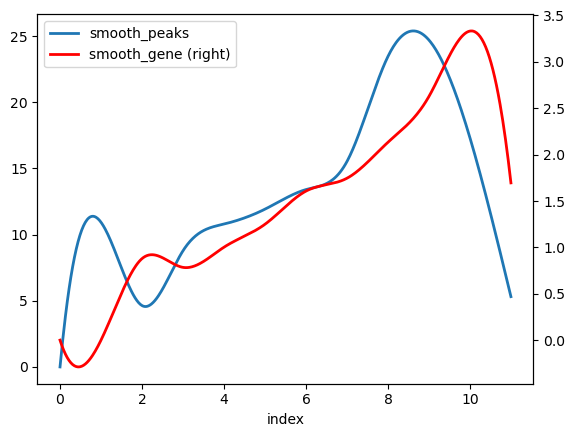

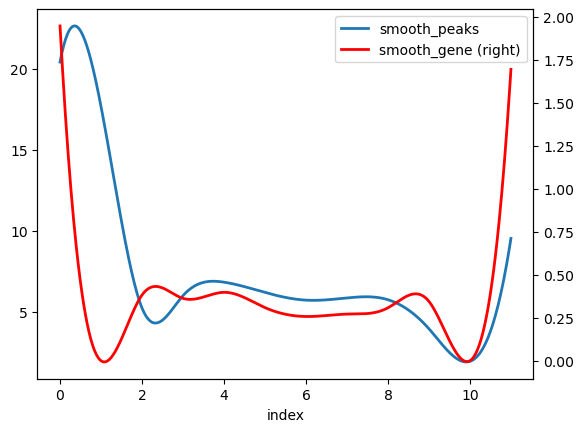

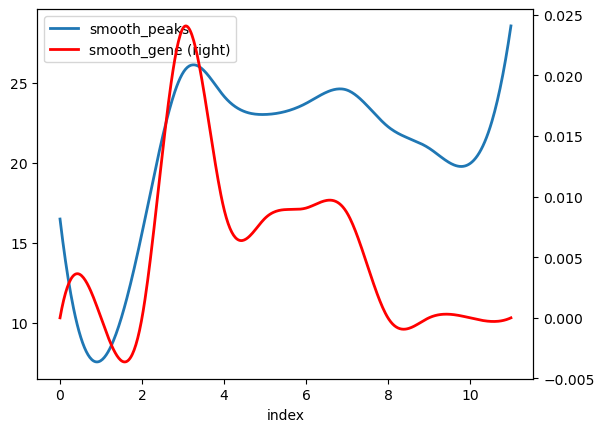

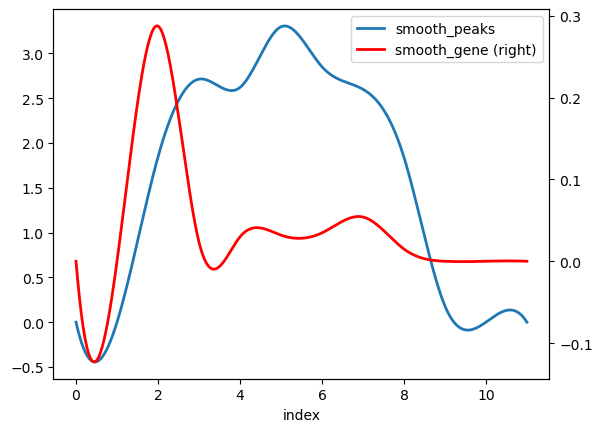

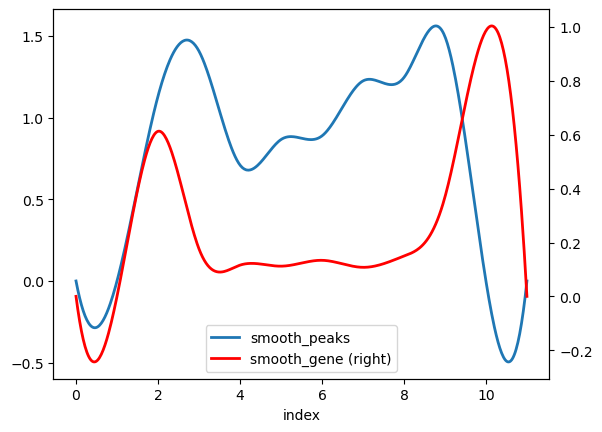

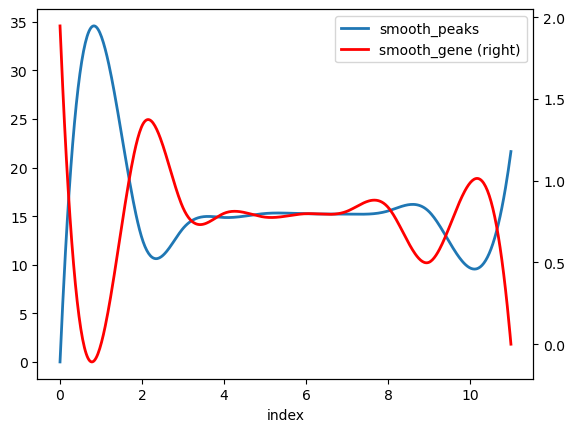

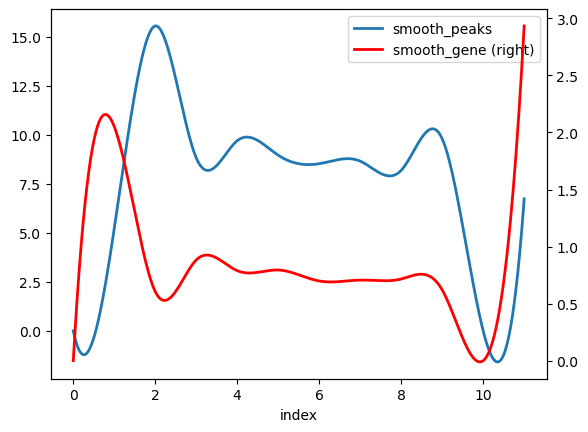

In [62]:
rna_data.obs["latent_time_2"] = pd.cut(rna_data.obs['GATA3-norm'], 12, labels=[str(i) for i in range(12)])

# 0.0017203619907659728
get_gene_local_atac("GATA3", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("GATA3", "latent_time_2",2, points=500)

# 0.15012334462405663
get_gene_local_atac("NFATC1", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("NFATC1", "latent_time_2",2, points=500)

# 0.0702422218425176
get_gene_local_atac("FOXP3", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("FOXP3", "latent_time_2",2, points=500)


# 0.06659905057241478
get_gene_local_atac("TBX21", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("TBX21", "latent_time_2",2, points=500)

# 0.12901973668472566
get_gene_local_atac("IKZF2", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("IKZF2", "latent_time_2",2, points=500)


# -0.0780947625643913
get_gene_local_atac("TCF7", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("TCF7", "latent_time_2",2, points=500)


# -0.14743043295488967
get_gene_local_atac("LEF1", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("LEF1", "latent_time_2",2, points=500)



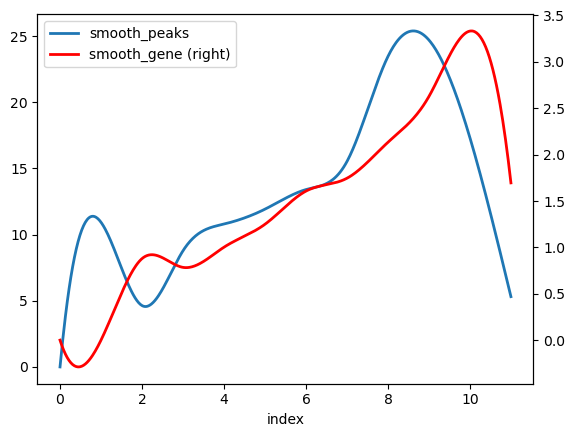

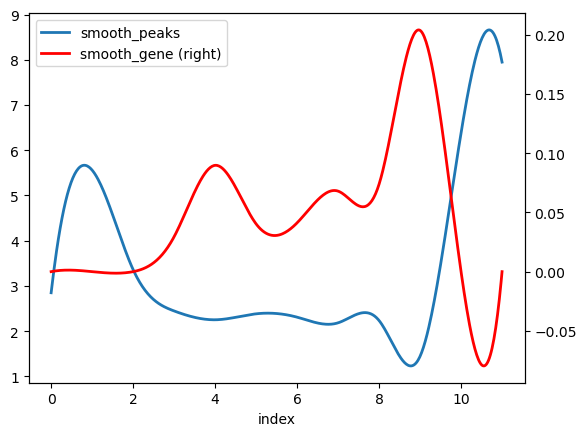

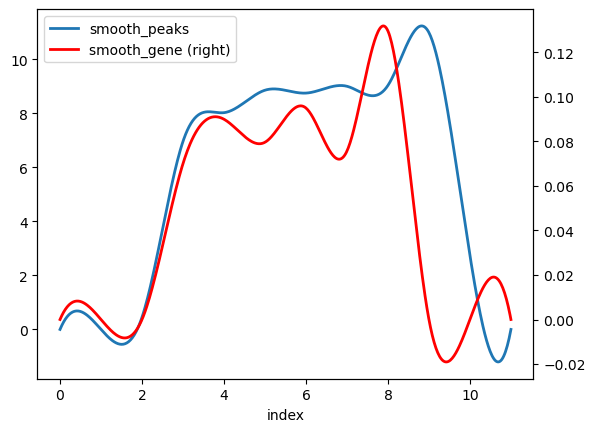

In [63]:
rna_data.obs["latent_time_2"] = pd.cut(rna_data.obs['GATA3-norm'], 12, labels=[str(i) for i in range(12)])

# 0.0017203619907659728
get_gene_local_atac("GATA3", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("GATA3", "latent_time_2",2, points=500)

# 0.119305
get_gene_local_atac("MAN1B1", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("MAN1B1", "latent_time_2",2, points=500)

# # -0.129312
# get_gene_local_atac("RNF125", litemodel, rna_data, atac_data, norm_X)
# smooth_gene_peaks_plot("RNF125", "latent_time_2",2, points=500)

# -0.079391
get_gene_local_atac("CD40LG", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("CD40LG", "latent_time_2",2, points=500)



In [71]:
## rank the latent enriched genes with scores

## read the gene list
index_file = 21
genelist = np.loadtxt("./figs/NEAT_seq_30LF/RNA_feature/NEAT_seq_latent_{}_genes.txt".format(index_file), dtype=str).tolist()
genelist = [e.upper() for e in genelist]
genelist = np.intersect1d(genelist, rp_genes)
print(len(genelist))

gene_length = 30 if len(genelist) > 30 else len(genelist)
scores = []
gene_list = []
for genename in genelist[:gene_length]:
    try:
        genename = genename.upper()
        time = "GATA3-norm"
        score, _, _ = gene_level_casual(genename,time, litemodel,rna_data,atac_data, norm_X,width=0.1)
        scores.append(score)
        gene_list.append(genename)
    except:
        continue    

36
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)


/home/haiyi/Desktop/HierachicalCausal_Omics/causal_utils/infer_nonsta_dir.py:17: RuntimeWarning: divide by zero encountered in true_divide
  X = np.matmul(X, np.diag(1./np.std(X, axis=0, ddof=1)))
/home/haiyi/Desktop/HierachicalCausal_Omics/causal_utils/infer_nonsta_dir.py:17: RuntimeWarning: invalid value encountered in matmul
  X = np.matmul(X, np.diag(1./np.std(X, axis=0, ddof=1)))
/home/haiyi/Desktop/HierachicalCausal_Omics/causal_utils/infer_nonsta_dir.py:20: RuntimeWarning: divide by zero encountered in true_divide
  Y = np.matmul(Y, np.diag(1/np.std(Y, axis=0,  ddof=1)))
/home/haiyi/Desktop/HierachicalCausal_Omics/causal_utils/infer_nonsta_dir.py:20: RuntimeWarning: invalid value encountered in matmul
  Y = np.matmul(Y, np.diag(1/np.std(Y, axis=0,  ddof=1)))


peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time (3370,)
peaks shap (3370,), genes (3370,), time 

In [65]:
gene_score_df = pd.DataFrame({"gene": gene_list, "decouple_score":scores})    

In [66]:
print(gene_score_df.decouple_score.mean(), gene_score_df.decouple_score.std())
gene_score_df.sort_values("decouple_score", ascending=False)

-0.033666485962159896 0.11241859226612272


,gene,decouple_score
6,CKLF,0.197216
8,CYTH2,0.136967
3,BACH2,0.068591
14,LIMD1,0.062660
10,FXYD1,0.055225
11,GXYLT1,0.023097
19,MAGI3,0.022887
0,ADAM12,0.012458
1,ARL3,0.012456
23,MOB1B,0.009583


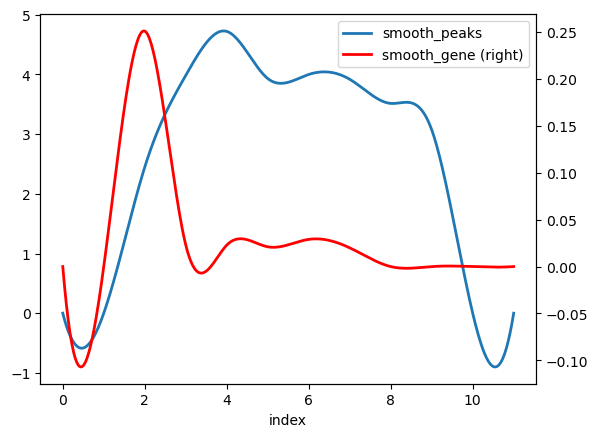

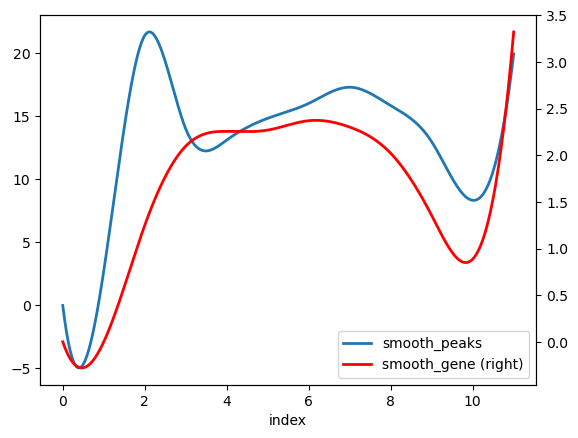

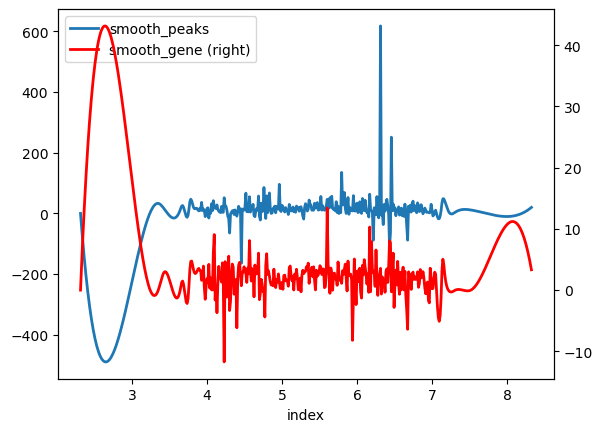

In [70]:
rna_data.obs["latent_time_2"] = pd.cut(rna_data.obs['GATA3-norm'], 12, labels=[str(i) for i in range(12)])

# 0.197216
get_gene_local_atac("CKLF", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("CKLF", "latent_time_2",2, points=500)


get_gene_local_atac("BACH2", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("BACH2", "latent_time_2",2, points=500)

smooth_gene_peaks_plot("BACH2", 'GATA3-norm',2, points=500)



In [146]:
print(gene_score_df.decouple_score.mean(), gene_score_df.decouple_score.std())
gene_score_df.sort_values("decouple_score", ascending=False)

-0.015335889464855035 0.07006882278262895


,gene,decouple_score
16,MAN1B1,0.119305
3,BAZ2B,0.101066
13,ELOVL4,0.080715
9,CSF1,0.061327
14,FAM117B,0.059957
11,DNAJC18,0.038447
7,CDC16,0.033260
4,C1QTNF6,0.023352
17,MFSD4B,0.011186
5,CCDC146,-0.012102


In [189]:
gene_score_df.to_csv("./figs/NEAT_seq_30LF/RNA_feature_decouple_score/NEAT_seq_latent_{}_genes_decouple_score.txt".format(index_file))

In [190]:
rna_data

AnnData object with n_obs × n_vars = 3370 × 13380
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell_id', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'ReadsInPeaks', 'FRIP', 'cell_id2', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_ChromVar', 'nFeature_ChromVar', 'RNA_snn_res.0.6', 'seurat_clusters', 'nCount_ADT', 'nFeature_ADT', 'S.Score', 'G2M.Score', 'Phase', 'FOXP3-norm', 'Helios-norm', 'Tbet-norm', 'GATA3-norm', 'RORgT-norm', 'batch_id', 'modality', 'new_clusters', '_scvi_batch', '_scvi_labels', 'epxr_latent_0', 'epxr_latent_1', 'epxr_latent_2', 'epxr_latent_3', 'epxr_latent_4', 'epxr_latent_5', 'epxr_latent_6', 'epxr_latent_7', 'epxr_latent_8', 'epxr_latent_9', 'epxr_latent_10', 'epxr_latent_11', 'epxr_latent_12', 'epxr_latent_13', 'epxr_latent_14', 'epxr_latent_15', 'epxr_latent_16', 'epxr_latent_17', 'epxr_latent_18

In [198]:
import scipy
print(scipy.stats.pearsonr(rna_data.obs['GATA3-norm'],rna_data.obs['epxr_latent_18']))
print(scipy.stats.pearsonr(rna_data.obs['GATA3-norm'],rna_data.obs['epxr_latent_27']))



(0.08729029626875898, 3.871705519541726e-07)
(0.10991201901965263, 1.5783460002817034e-10)


In [91]:
## rank the latent enriched genes with scores

## read the gene list
index_file = 
genelist = np.loadtxt("BM_latent_{}_genes.txt".format(index_file), dtype=str).tolist()
genelist = [e.upper() for e in genelist]
genelist = np.intersect1d(genelist, rp_genes)
print(len(genelist))
gene_length = 30 if len(genelist) > 30 else len(genelist)
scores = []
for genename in genelist[:gene_length]:
    try:
        genename = genename.upper()
        time = "latent_time_3"
        score, _, _ = gene_level_casual(genename,time, litemodel,rna_data,atac_data, norm_X,width=0.1)
        scores.append(score)
    except:
        continue    


41
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), time (3365,)
peaks shap (3365,), genes (3365,), ti

In [45]:
print(len(scores))

29


In [51]:

# genelist = np.delete(genelist, "GM15398")
# genelist = np.delete(genelist, 15)
# genelist

array(['ACSBG1', 'C430049B03RIK', 'CACNB2', 'CAP2', 'CELSR1', 'CEMIP2',
       'DOCK11', 'DPYD', 'EGFLAM', 'ELAVL2', 'ELP4', 'ERBB4', 'EYA4',
       'FANCA', 'GM14697', 'GM26708', 'GM32647', 'GPC5', 'HEATR5A',
       'IGDCC4', 'IL10RB', 'ISLR2', 'KCNAB1', 'KIF26B', 'LIPG', 'LRFN2',
       'MFAP4', 'MICAL2', 'NALCN', 'NEDD9', 'OSTM1', 'PLK1', 'PLTP',
       'RHOQ', 'SCHIP1', 'SCN2A', 'SEMA5A', 'SERPINH1', 'SLC10A7',
       'SLC2A13', 'ST5', 'STAT3', 'TBC1D4', 'TCERG1L', 'TEAD2',
       'TMEM132B', 'TMEM164', 'TOP2A'], dtype='<U13')

In [94]:
gene_score_df.to_csv("BM_latent_{}_score_latent3.csv".format(index_file))

ELDR
IRS1
GALNT9
CP
ASIC2
GCG
GM32828
NPAS2
HK2
GNAL


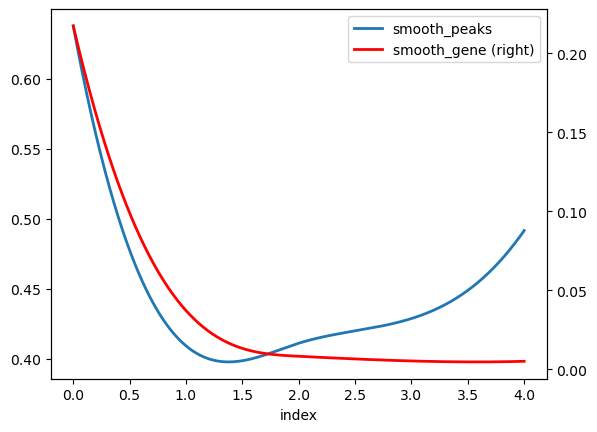

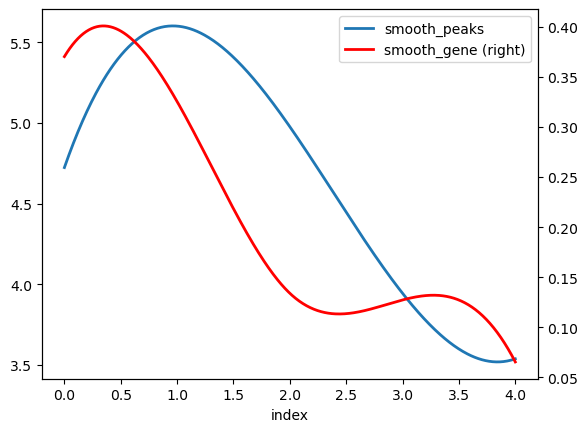

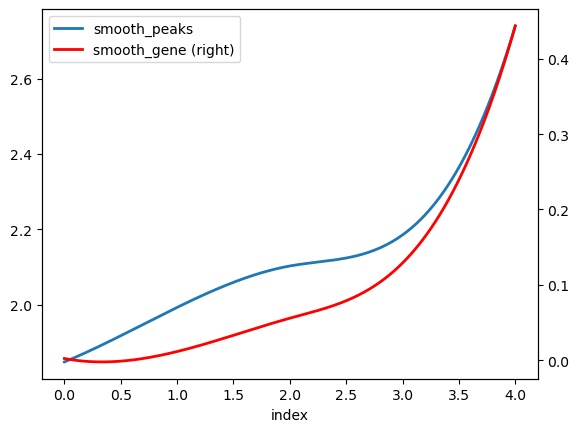

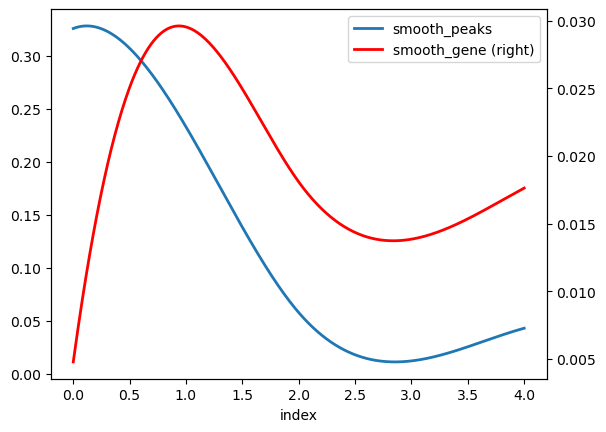

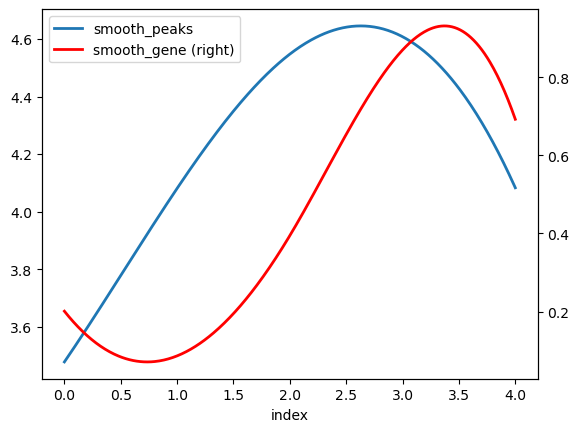

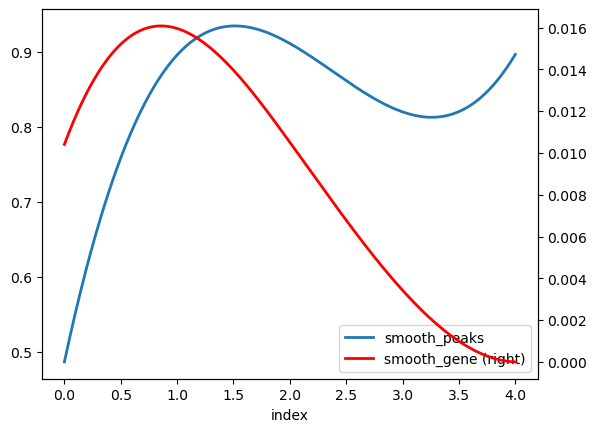

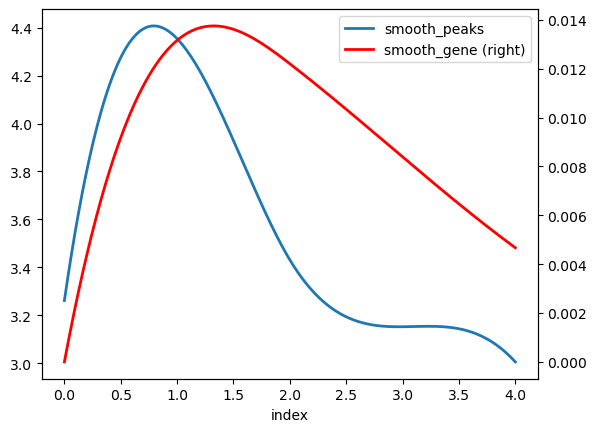

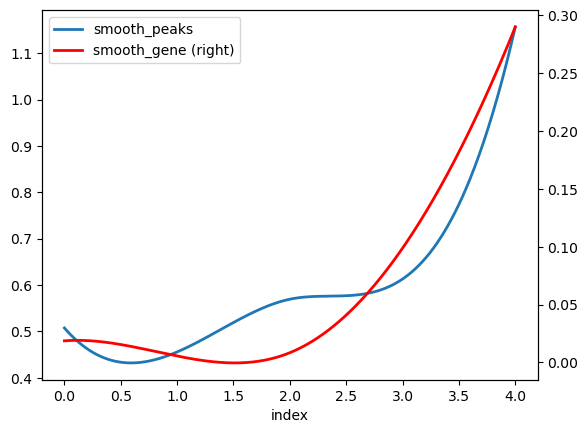

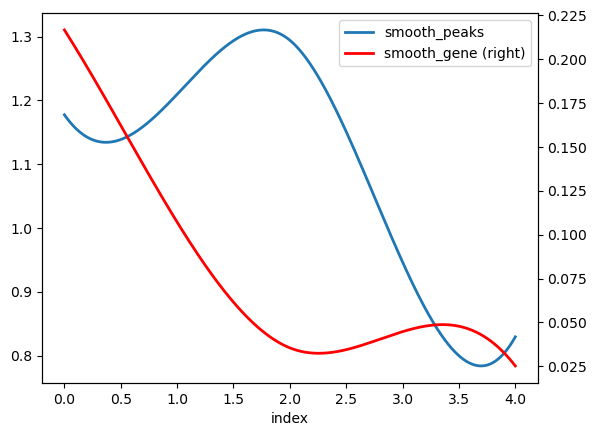

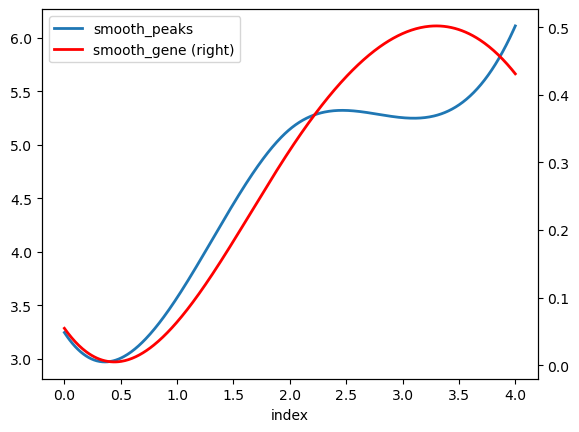

In [96]:
decouple = gene_score_df.sort_values("decouple_score", ascending=False)
for gene in decouple.gene.to_list()[5:15]:
    print(gene)
    get_gene_local_atac(gene.upper(), litemodel, rna_data, atac_data, norm_X)
    smooth_gene_peaks_plot(gene.upper(), "latent_time_3",2, points=500)


FRAS1
GALNT9
ID3
FAT1
HK2


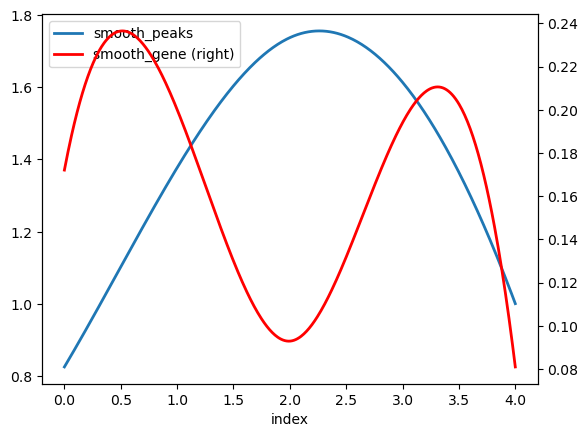

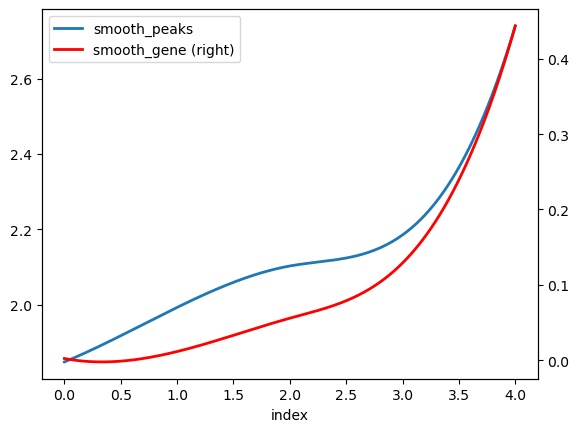

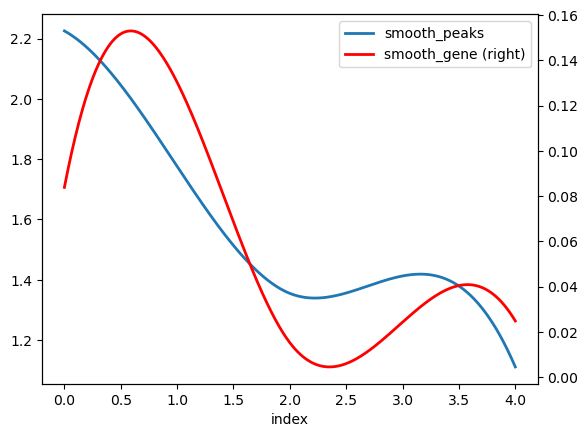

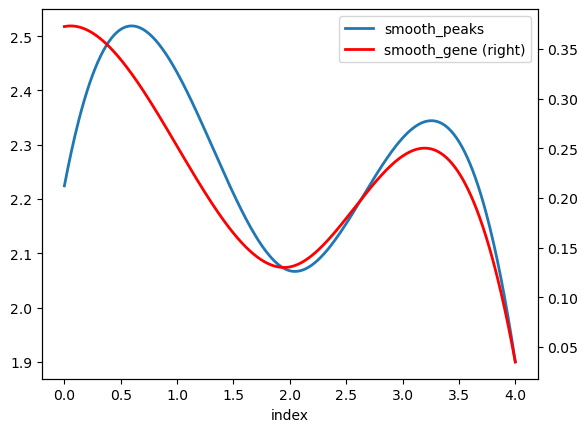

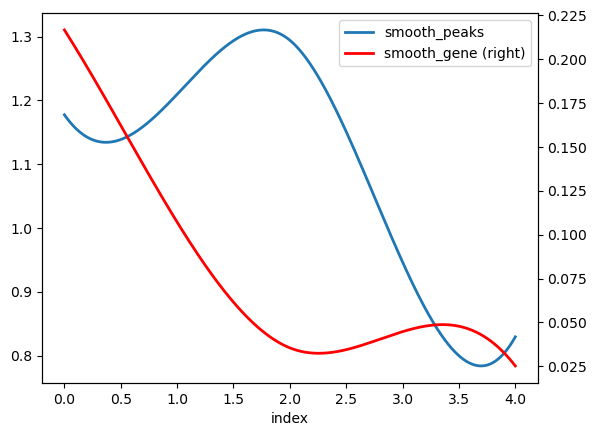

In [65]:
couple = gene_score_df.sort_values("decouple_score", ascending=True)
for gene in couple.gene.to_list()[:5]:
    print(gene)
    get_gene_local_atac(gene.upper(), litemodel, rna_data, atac_data, norm_X)
    smooth_gene_peaks_plot(gene.upper(), "latent_time_3",2, points=500)

    

LAMB1
NRP1
HECW2
RGL1
LRP4


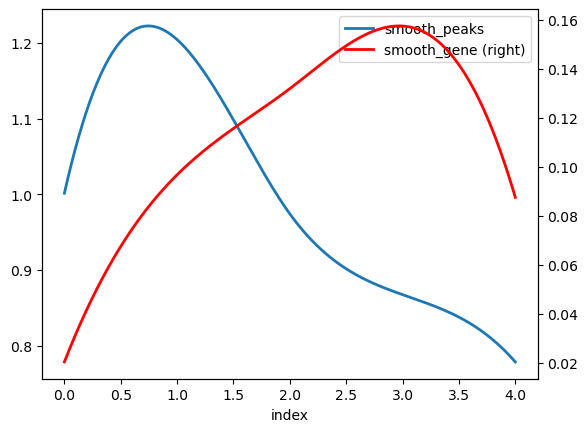

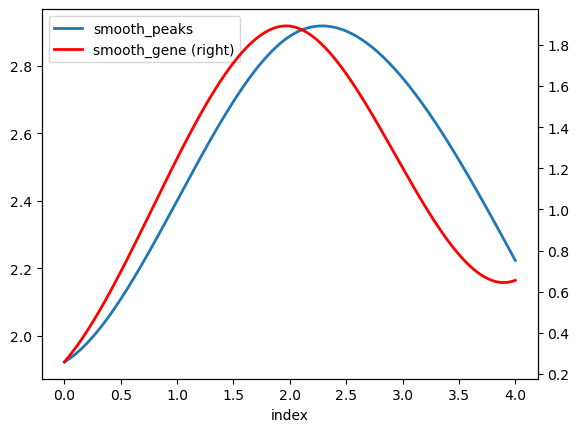

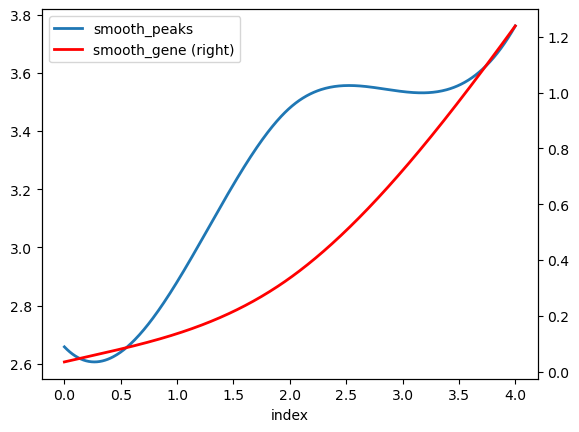

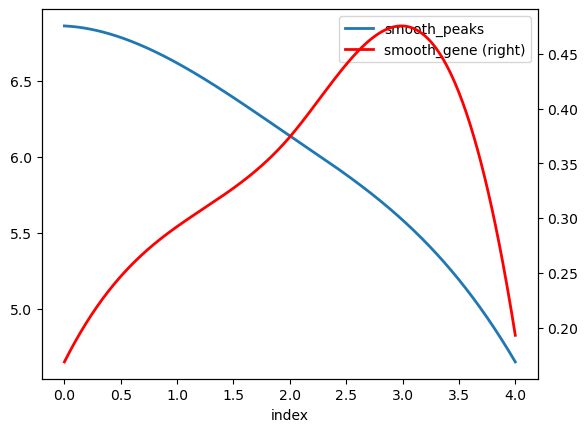

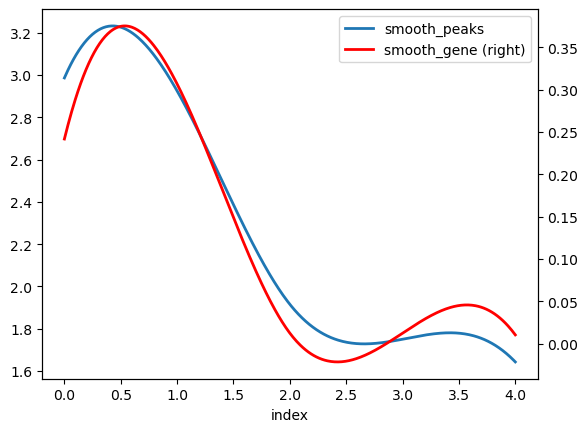

In [31]:
# couple = gene_score_df.sort_values("decouple_score", ascending=False)
for gene in couple.gene.to_list()[-5:]:
    print(gene)
    get_gene_local_atac(gene.upper(), litemodel, rna_data, atac_data, norm_X)
    smooth_gene_peaks_plot(gene.upper(), "latent_time_3",2, points=500)


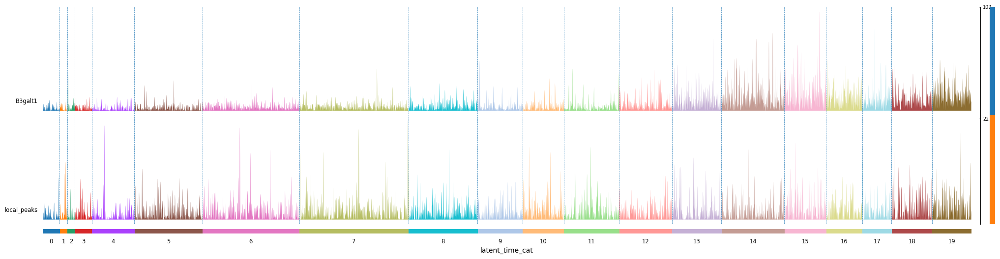

In [92]:

genes_dict = {"decoupled":"B3galt1", "atac": 'local_peaks'} 
get_gene_local_atac("B3GALT1", litemodel, rna_data, atac_data, norm_X)

ax = sc.pl.tracksplot(rna_data, genes_dict, groupby='latent_time_cat', figsize=[25, 6])

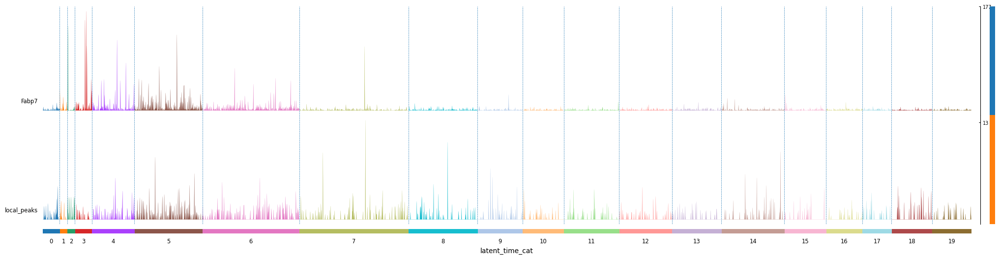

In [60]:

genes_dict = {"decoupled":"Fabp7", "atac": 'local_peaks'} 
get_gene_local_atac("FABP7", litemodel, rna_data, atac_data, norm_X)

ax = sc.pl.tracksplot(rna_data, genes_dict, groupby='latent_time_cat', figsize=[25, 6])

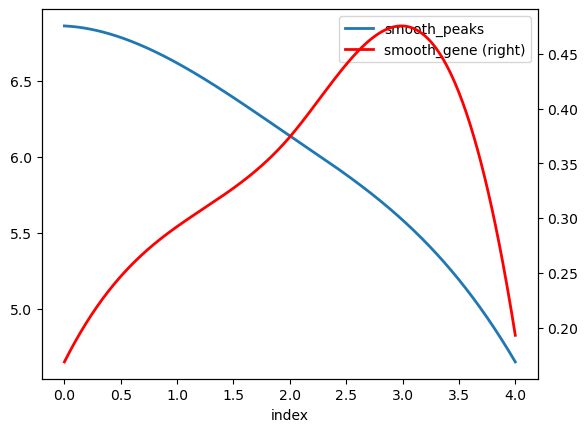

In [88]:
get_gene_local_atac("RGL1", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("RGL1", "latent_time_3",2, points=500)

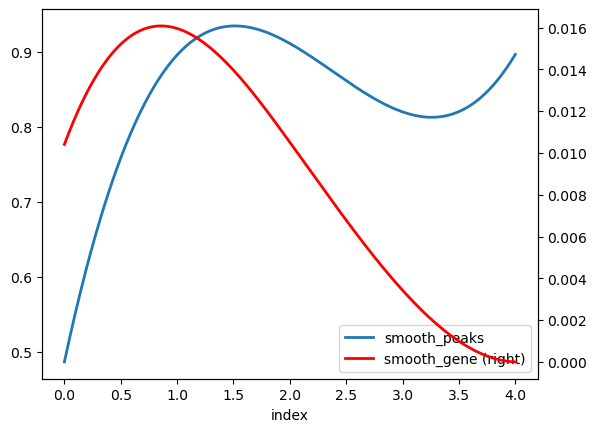

In [98]:
## Trim 2

get_gene_local_atac("GCG", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("GCG", "latent_time_3",2, points=500)

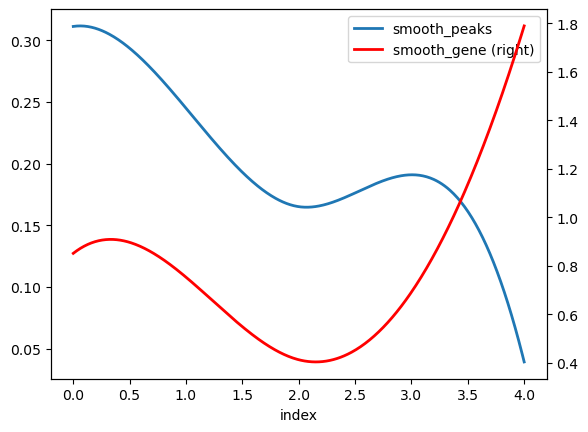

In [34]:
## GRIN2B
get_gene_local_atac("VCAN", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("VCAN", "latent_time_3",2, points=500)

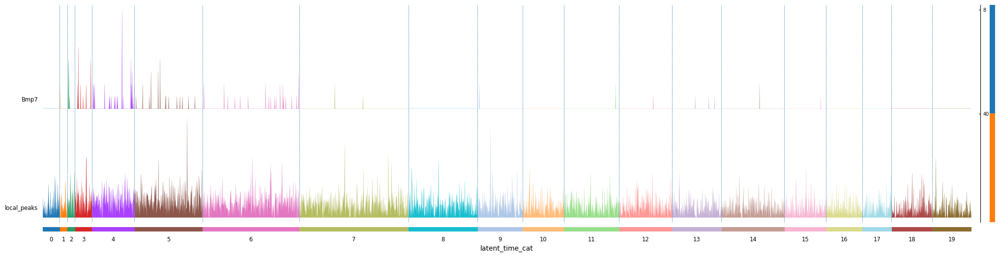

In [28]:
genes_dict = {"decoupled":"Bmp7", "atac": 'local_peaks'} 
get_gene_local_atac("BMP7", litemodel, rna_data, atac_data, norm_X)
ax = sc.pl.tracksplot(rna_data, genes_dict, groupby='latent_time_cat', figsize=[25, 6])

/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:295: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['distance_to_TSS'] = np.abs(dist)
/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['is_upstream'] = dist <= 0


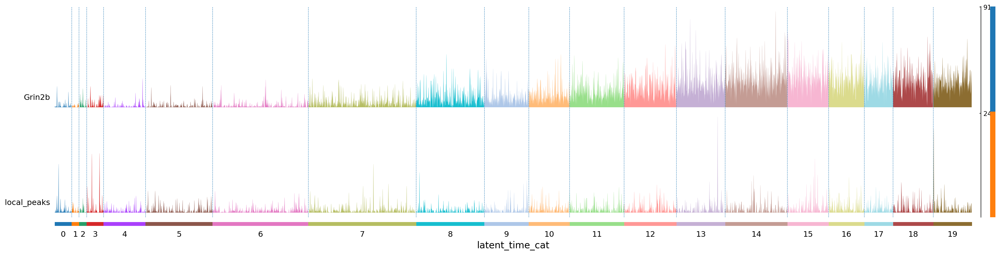

In [235]:
genes_dict = {"coupled":"Grin2b", "atac": 'local_peaks'} 
get_gene_local_atac("GRIN2B", litemodel, rna_data, atac_data, norm_X)

ax = sc.pl.tracksplot(rna_data, genes_dict, groupby='latent_time_cat', dendrogram=False, figsize=[25, 6])

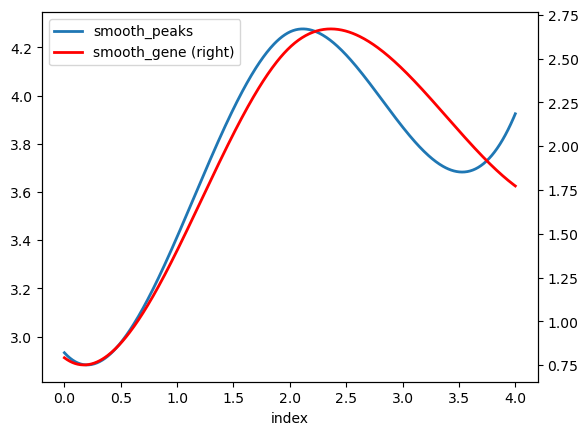

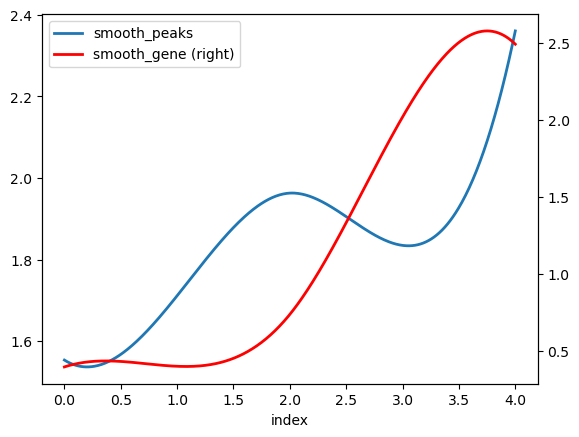

In [39]:
## Kirrel3, ROBO1
get_gene_local_atac("ROBO1", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("ROBO1", "latent_time_3",2, points=500)


get_gene_local_atac("KIRREL3", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("KIRREL3", "latent_time_3",2, points=500)


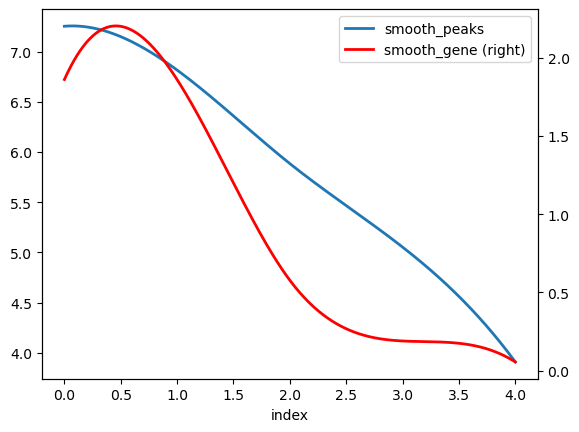

In [41]:
get_gene_local_atac("GM29260", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("GM29260", "latent_time_3",2, points=500)


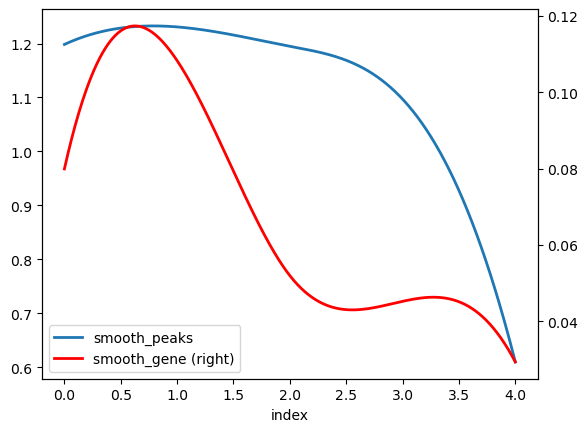

In [43]:
get_gene_local_atac("PHLDA1", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("PHLDA1", "latent_time_3",2, points=500)


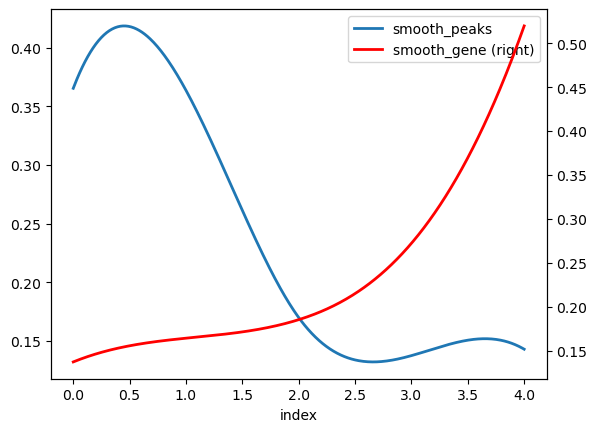

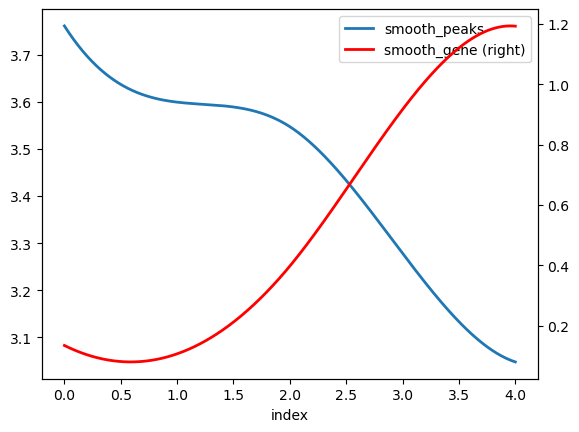

In [48]:
### SOX2OT, SOX2

get_gene_local_atac("NALCN", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("NALCN", "latent_time_3",2, points=500)


get_gene_local_atac("RIAN", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("RIAN", "latent_time_3",2, points=500)


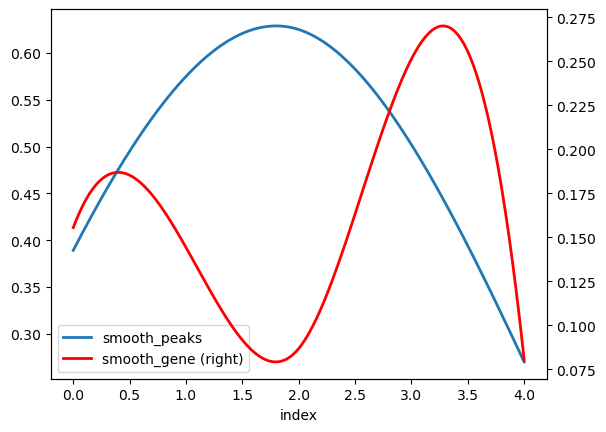

In [54]:

get_gene_local_atac("GPC5", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("GPC5", "latent_time_3",2, points=500)


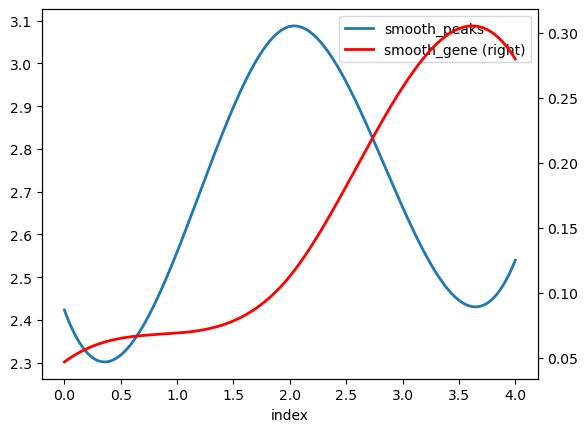

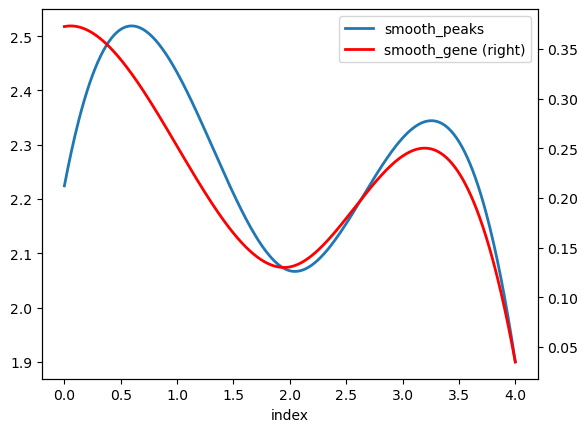

In [63]:
get_gene_local_atac("PEX5L", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("PEX5L", "latent_time_3",2, points=500)




get_gene_local_atac("FAT1", litemodel, rna_data, atac_data, norm_X)
smooth_gene_peaks_plot("FAT1", "latent_time_3",2, points=500)


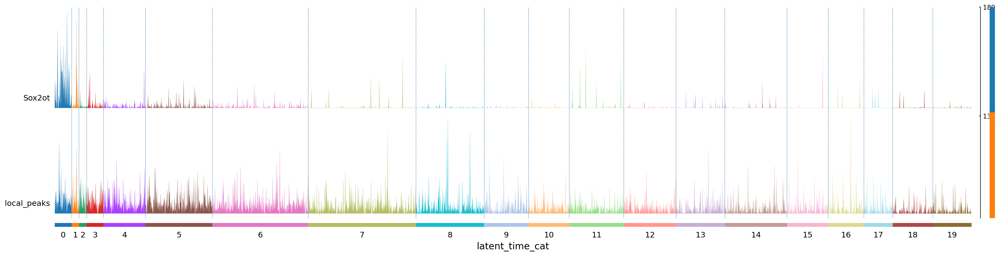

In [172]:
get_gene_local_atac("SOX2OT", litemodel, rna_data, atac_data, norm_X)
genes_dict = {"decoupled":"Sox2ot", "atac": 'local_peaks'} 

ax = sc.pl.tracksplot(rna_data, genes_dict, groupby='latent_time_cat', dendrogram=False, figsize=[25, 6])

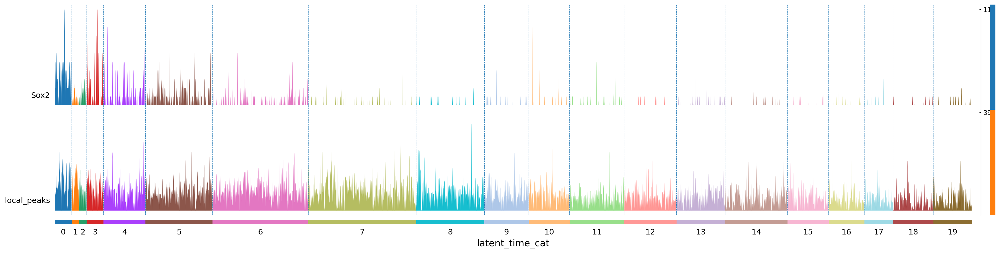

In [173]:
get_gene_local_atac("SOX2", litemodel, rna_data, atac_data, norm_X)
genes_dict = {"decoupled":"Sox2", "atac": 'local_peaks'} 

ax = sc.pl.tracksplot(rna_data, genes_dict, groupby='latent_time_cat', dendrogram=False, figsize=[25, 6])

In [74]:
rna_data.write_h5ad("data/datasets/mouse_brain_rna_mira_local.h5ad")


In [82]:
couple_genes = ['Foxp1','Lrrtm4', 'Vcan','Sik3','Dph6','Rgma','Arhgap20','Itgb3bp','Ttyh1']

/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:295: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['distance_to_TSS'] = np.abs(dist)
/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['is_upstream'] = dist <= 0


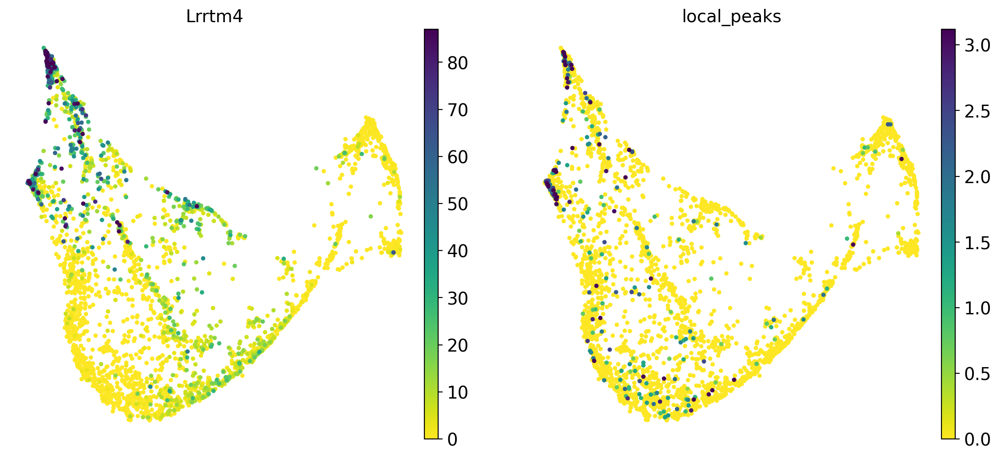

In [75]:
get_gene_local_atac("LRRTM4", litemodel, rna_data, atac_data, norm_X)
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(rna_data, color=['Lrrtm4', "local_peaks"], s=50, frameon=False, ncols=2, vmax='p99')


/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:295: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['distance_to_TSS'] = np.abs(dist)
/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['is_upstream'] = dist <= 0


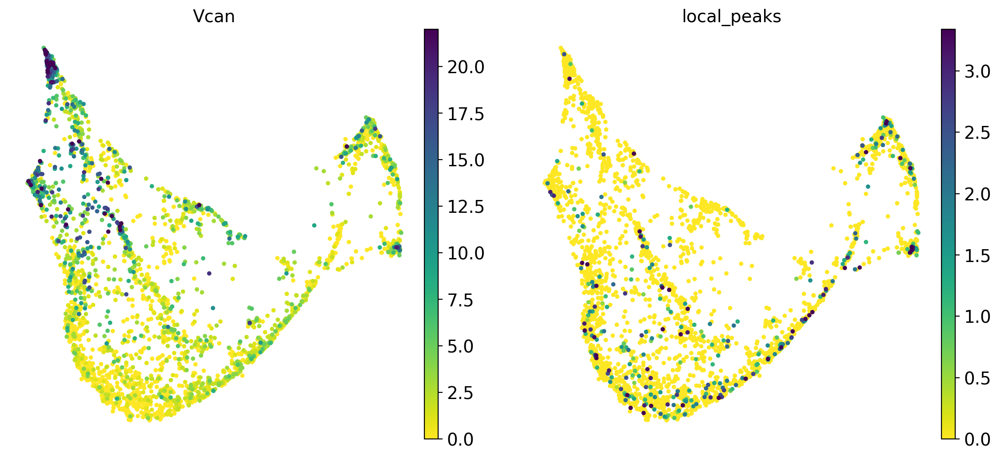

In [76]:
get_gene_local_atac("VCAN", litemodel, rna_data, atac_data, norm_X)
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(rna_data, color=['Vcan', "local_peaks"], s=50, frameon=False, ncols=2, vmax='p99')


/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:295: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['distance_to_TSS'] = np.abs(dist)
/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['is_upstream'] = dist <= 0


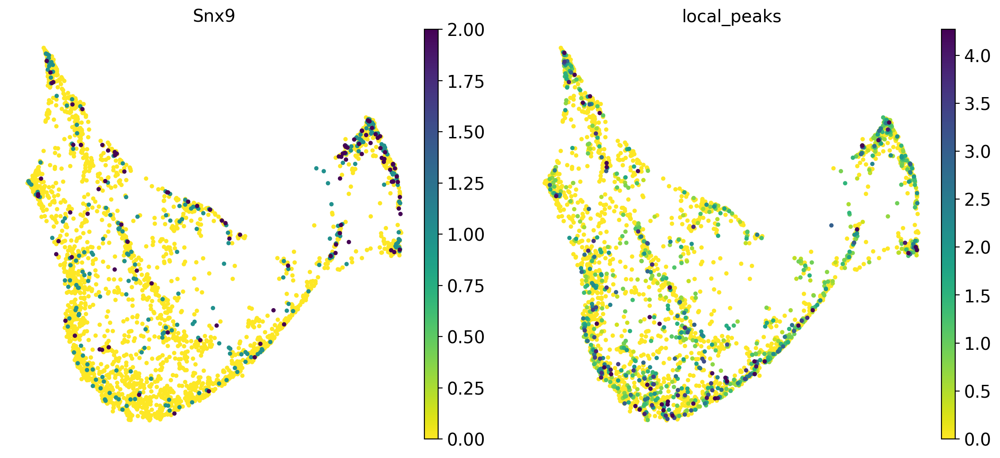

In [94]:
#Itgb3bp

get_gene_local_atac("SNX9", litemodel, rna_data, atac_data, norm_X)
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(rna_data, color=['Snx9', "local_peaks"], s=50, frameon=False, ncols=2, vmax='p99')

/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:295: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['distance_to_TSS'] = np.abs(dist)
/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['is_upstream'] = dist <= 0


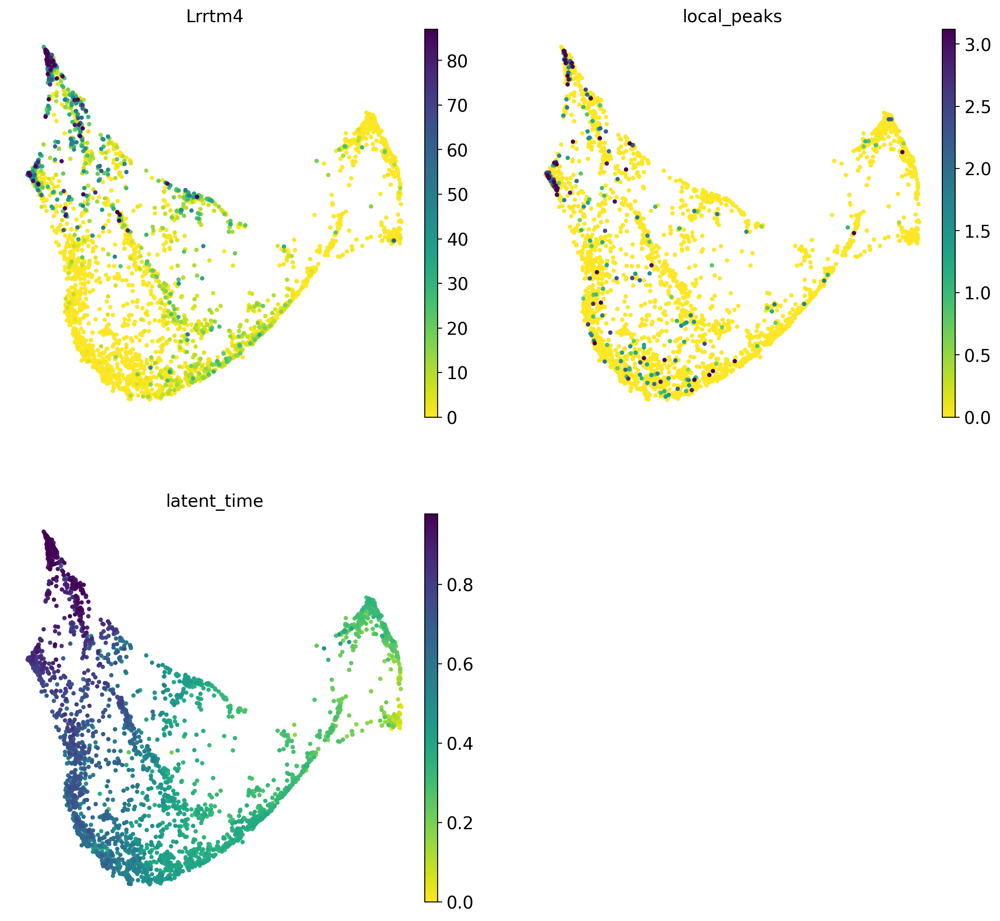

In [88]:
get_gene_local_atac("LRRTM4", litemodel, rna_data, atac_data, norm_X)
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(rna_data, color=['Lrrtm4', "local_peaks", "latent_time"], s=50, frameon=False, ncols=2, vmax='p99')

/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:295: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['distance_to_TSS'] = np.abs(dist)
/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['is_upstream'] = dist <= 0


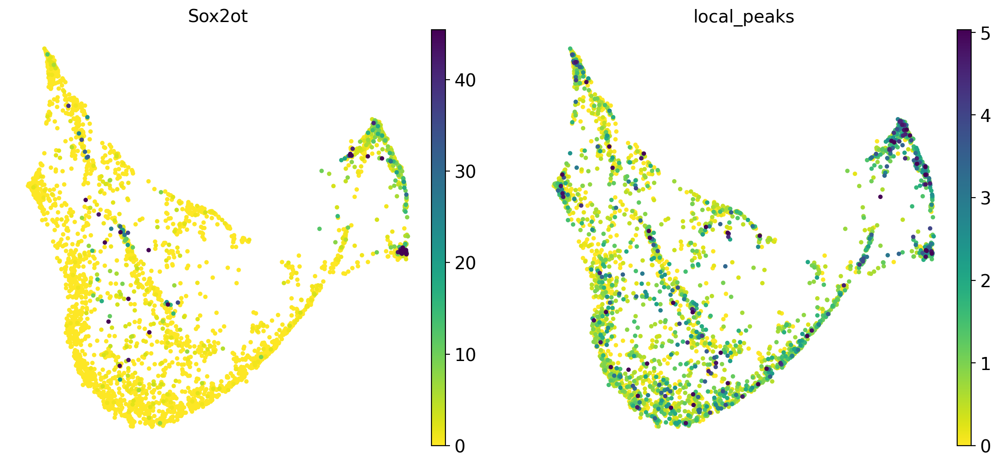

In [138]:

get_gene_local_atac("SOX2OT", litemodel, rna_data, atac_data, norm_X)
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(rna_data, color=["Sox2ot", "local_peaks"], s=50, frameon=False, ncols=5, vmax='p99')

/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:295: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['distance_to_TSS'] = np.abs(dist)
/home/haiyi/anaconda3/envs/halo2/lib/python3.7/site-packages/mira/adata_interface/rp_model.py:296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proximal_peaks['is_upstream'] = dist <= 0


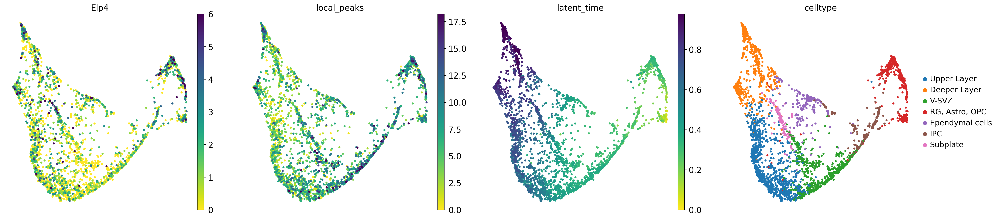

In [105]:
get_gene_local_atac("ELP4", litemodel, rna_data, atac_data, norm_X)
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(rna_data, color=["Elp4", "local_peaks", "latent_time", "celltype"], s=50, frameon=False, ncols=5, vmax='p99')